In [1]:
# Note: You have to create two empty folders in the working dirctory with names: "images" and "results"
from all_functions import *

# Dataset 1 (Baseline tests)

In [2]:
# The following dataset has 71 samples (40 patients and 31 normal) and 364 features
# Note: Status variable contains the status of tests for persons if he is patient (1) or healthy (0)
# All variables that starts with "Var-" represents the 364 features

data = pd.read_csv('First_Classification_Problem_data_part1.csv', delimiter = ";")

In [3]:
data.head()

,Person,Var-1,Var-2,Var-3,Var-4,Var-5,Var-6,Var-7,Var-8,Var-9,...,Var-356,Var-357,Var-358,Var-359,Var-360,Var-361,Var-362,Var-363,Var-364,Status
0,Met_Fraction_P1,6.569858,2.029398,5.788097,48.079410,37.284389,19.040816,5.518024,4.990208,15.321464,...,7.241426,6.360828,5.591035,0.125945,1.600272,3.012774,6.628313,9.092788,15.697375,1
1,Met_Fraction_P2,0.025316,0.000000,1.890561,3.528814,5.721124,0.579203,2.224677,0.539874,0.000000,...,3.193499,1.350551,1.028241,0.878356,0.019406,0.936561,0.008796,0.000000,0.769654,1
2,Met_Fraction_P3,1.187613,2.268866,4.343989,20.672904,12.727355,5.209590,4.074126,3.332255,7.505179,...,2.315563,3.362230,3.389353,0.169881,0.775841,3.767616,4.983143,3.664472,7.061640,1
3,Met_Fraction_P4,0.000000,0.740579,1.007231,6.898386,2.253878,1.406250,2.974909,4.695571,1.666173,...,2.186226,1.162914,1.300637,0.000000,0.334643,2.281767,2.023891,0.726041,10.087719,1
4,Met_Fraction_P5,0.000000,0.108006,8.363747,14.831461,13.804971,7.266967,9.611971,7.045513,4.497099,...,8.127561,0.290698,3.985765,6.692658,0.000000,13.736655,7.315427,0.000000,25.308642,1


In [4]:
data.shape

(71, 366)

In [5]:
#data.dtypes
data.describe()

,Var-1,Var-2,Var-3,Var-4,Var-5,Var-6,Var-7,Var-8,Var-9,Var-10,...,Var-356,Var-357,Var-358,Var-359,Var-360,Var-361,Var-362,Var-363,Var-364,Status
count,70.000000,71.000000,71.000000,71.000000,71.000000,70.000000,71.000000,70.000000,71.000000,71.000000,...,71.000000,71.000000,70.000000,70.000000,71.000000,71.000000,71.000000,69.000000,71.000000,71.000000
mean,1.744636,3.243328,5.428132,11.550798,6.745794,6.851557,4.571989,4.734957,2.653626,9.193447,...,6.611906,4.423311,4.814195,1.566717,1.942020,4.474524,4.727771,6.629228,14.835572,0.563380
std,4.353697,10.674668,13.273053,17.237717,11.668318,13.675905,9.386328,6.710558,3.943980,9.833561,...,13.606881,11.296869,11.363930,6.254663,7.507927,10.480174,7.960054,14.271324,15.675661,0.499497
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.490340,0.326700,0.025184,0.841232,0.309807,0.006199,4.246418,...,0.721931,0.000000,0.259210,0.000000,0.000000,0.000000,0.048076,0.000000,5.856770,0.000000
50%,0.021253,0.425532,0.373832,4.740125,2.253878,1.786971,2.047444,2.485774,1.294926,6.313695,...,2.315563,0.573566,2.204836,0.000000,0.022538,1.100995,1.923475,0.644745,10.225989,1.000000
75%,1.186318,1.571165,3.227799,14.732804,7.098460,5.659149,4.016292,4.931363,3.156113,10.457299,...,5.461774,3.669594,3.208792,0.092584,0.452308,3.345028,5.043690,5.216228,16.023092,1.000000
max,21.708185,76.190476,82.749608,84.699205,66.397188,77.133234,54.642182,29.809104,18.758256,58.451348,...,78.899348,68.965517,79.028007,43.281654,44.224989,68.575064,36.649215,63.541667,82.869198,1.000000


<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 

# Data perprocessing for Dataset 1 

In [6]:
#Check total missing values in dataset
np.sum( data.isnull().sum() )

40

In [7]:
#Check missing values in columns
mask = data.isnull().any(axis=0)
data.columns[mask]

Index(['Var-1', 'Var-6', 'Var-8', 'Var-20', 'Var-24', 'Var-35', 'Var-48',
       'Var-71', 'Var-74', 'Var-78', 'Var-91', 'Var-92', 'Var-118', 'Var-119',
       'Var-135', 'Var-148', 'Var-150', 'Var-156', 'Var-159', 'Var-187',
       'Var-193', 'Var-207', 'Var-216', 'Var-222', 'Var-225', 'Var-240',
       'Var-241', 'Var-245', 'Var-253', 'Var-299', 'Var-300', 'Var-301',
       'Var-306', 'Var-328', 'Var-335', 'Var-358', 'Var-359', 'Var-363'],
      dtype='object')

In [8]:
#Check missing values in rows
mask = data.isnull().any(axis=1)
data[mask]

,Person,Var-1,Var-2,Var-3,Var-4,Var-5,Var-6,Var-7,Var-8,Var-9,...,Var-356,Var-357,Var-358,Var-359,Var-360,Var-361,Var-362,Var-363,Var-364,Status
38,Met_Fraction_P39,2.367531,0.895916,1.965726,9.627611,3.175102,2.591142,2.607626,4.242081,2.460064,...,3.34728,0.057604,2.821503,0.455235,1.294964,2.516654,2.737982,3.535354,12.790698,1
69,Met_Fraction_V30,0.000000,0.094877,0.000000,0.000000,0.000000,17.813384,0.000000,0.000000,0.000000,...,0.00000,0.000000,1.128122,0.000000,0.000000,0.000000,2.966841,NaN,4.830287,0
70,Met_Fraction_V31,NaN,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,NaN,0.000000,...,0.00000,68.965517,NaN,NaN,0.000000,0.000000,0.000000,NaN,19.531250,0


In [9]:
#Check missing vlaues individually row by row
for i in np.arange(data[mask].index.size):
    print('For person with index ' + str(data[mask].index[i]) + ' total missing values are : ' 
          + str( data.iloc[ data[mask].index[i] ].isnull().sum() ) )

For person with index 38 total missing values are : 1
For person with index 69 total missing values are : 2
For person with index 70 total missing values are : 37


In [10]:
#Sample with index 70 (it is the last sample) contains most of the missing values and it will be removed
data = data.drop(index=([70]))

In [11]:
#Check missing vlaues in sample with index 38
mask = data.iloc[38].isnull()
data.columns[mask]

Index(['Var-20'], dtype='object')

In [12]:
#Since the sample with index 38 is for patient, I replace the missing value by mean value of other patient samples

data.loc[38, 'Var-20'] = data['Var-20'].iloc[0:40].mean()

In [13]:
#Check missing vlaues in sample with index 69
mask = data.iloc[69].isnull()
data.columns[mask]

Index(['Var-193', 'Var-363'], dtype='object')

In [14]:
#Since the sample with index 69 is for normal, I replace the missing value by mean value of other normal samples

data.loc[69, 'Var-193'] = data['Var-193'].iloc[40:70].mean()
data.loc[69, 'Var-363'] = data['Var-363'].iloc[40:70].mean()

In [15]:
#Check if there is any missing value left
np.sum( data.isnull().sum() )

0

In [16]:
# Identify the features (input_data) and target (output_data) in the dataset
input_data = data.drop(['Person', 'Status'], axis=1)
output_data = data[['Status']]

In [17]:
# So we have in total 70 samples (40 patients and 30 normal) and 364 features
input_data.shape

(70, 364)

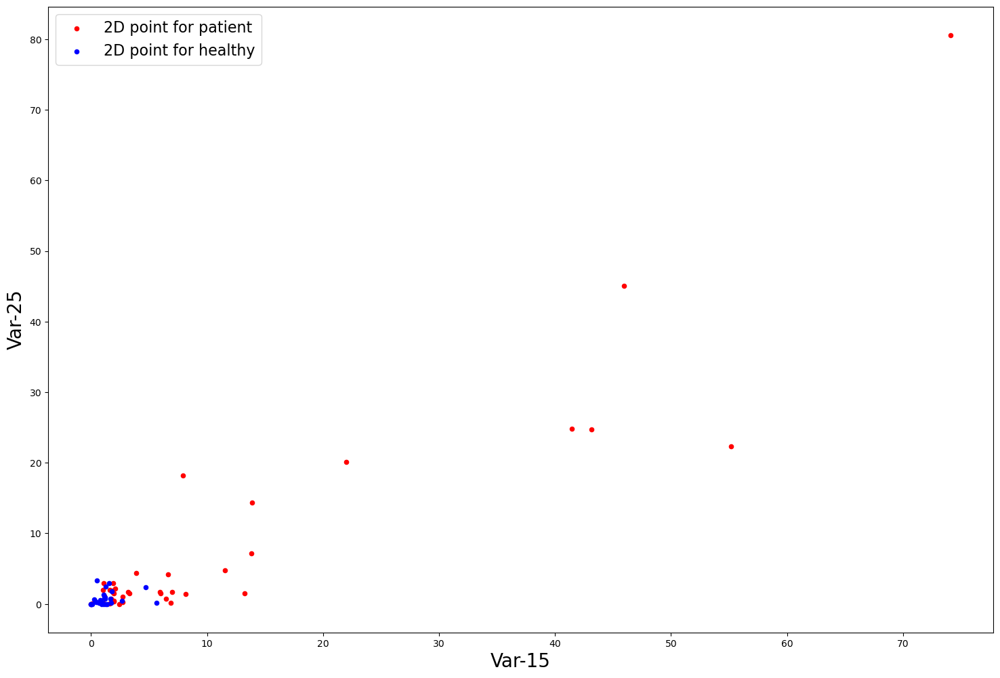

In [18]:
# Plot features in 2D space (normal)
plot_var_2d_rev01('Var-15', 'Var-25', input_data, 'n')

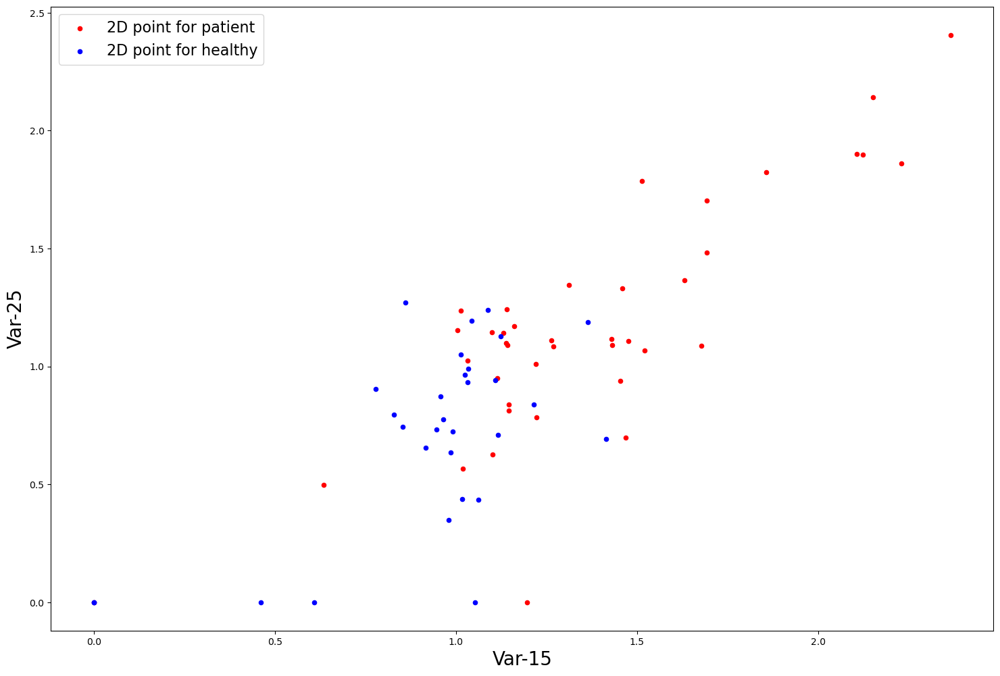

In [19]:
# Plot features in 2D space (with power function)
plot_var_2d_rev01('Var-15', 'Var-25', input_data, 'p')

In [20]:
# New aspect of features and target variables
X = np.power(input_data, (1/5))
y = output_data

<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 
<br> 

# Dataset 2

In [21]:
data2 = pd.read_csv('First_Classification_Problem_data_part2.csv', delimiter = ";")
data2.head()

,Person,Progression,Period_rounded,Var-1,Var-2,Var-3,Var-4,Var-5,Var-6,Var-7,...,Var-355,Var-356,Var-357,Var-358,Var-359,Var-360,Var-361,Var-362,Var-363,Var-364
0,Met_Fraction_P1_B2,0,1,0.000000,0.411878,2.366864,12.288055,5.253109,1.587534,3.627897,...,0.004160,1.858342,0.017669,1.436884,0.015741,0.087358,2.014388,1.705771,0.415800,5.998537
1,Met_Fraction_P1_B3,0,2,0.116048,0.313480,1.435850,5.309586,1.832672,1.076387,1.144352,...,0.037023,3.952626,0.000000,2.263856,0.000000,0.000000,0.329144,1.834550,0.122699,7.551320
2,Met_Fraction_P1_B4,0,3,0.000000,0.000000,0.000000,2.930330,3.147013,0.476581,2.407650,...,0.252056,1.376242,0.667737,1.276898,0.015058,0.000000,0.869868,0.536409,1.923968,0.902935
3,Met_Fraction_P1_B5,0,4,3.056478,0.993700,0.824931,6.813163,4.346014,3.198158,2.614942,...,0.189081,3.018526,0.951419,1.177499,0.000000,0.012132,2.810716,0.982308,5.036408,6.550218
4,Met_Fraction_P1_B6,0,5,0.028604,2.554229,0.020766,3.018358,2.653157,0.006963,1.101304,...,0.425758,2.988202,0.266509,0.030364,0.000000,0.013933,0.000000,3.896169,0.000000,0.159744


# Data perprocessing for Dataset 2

In [22]:
#Check total missing values in dataset
np.sum( data2.isnull().sum() )

12

In [23]:
#Check missing values in rows
mask = data2.isnull().any(axis=1)
data2[mask]

,Person,Progression,Period_rounded,Var-1,Var-2,Var-3,Var-4,Var-5,Var-6,Var-7,...,Var-355,Var-356,Var-357,Var-358,Var-359,Var-360,Var-361,Var-362,Var-363,Var-364
30,Met_Fraction_P16_B6,0,6,0.000000,0.000000,0.000000,9.512485,16.730038,0.000000,0.000000,...,0.000000,0.140449,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.547945
61,Met_Fraction_P6_B4,0,3,0.000000,0.885827,0.000000,9.732360,6.461676,4.164018,10.914136,...,0.848010,0.000000,4.486134,3.545455,0.000000,0.000000,0.000000,0.000000,0.000000,7.042254
84,Met_Fraction_P18_B11,0,11,0.206186,0.000000,2.515723,0.000000,0.000000,5.841121,0.000000,...,1.866475,0.571429,0.000000,0.000000,0.000000,0.000000,5.631868,0.000000,0.000000,0.000000
86,Met_Fraction_P18_B13,1,13,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,5.592105,0.000000,1.404494,0.000000,0.000000,0.169492,0.000000,NaN,0.000000
211,Met_Fraction_P39_B2,0,1,0.000000,0.114025,0.858369,5.464824,1.787592,1.339492,3.308629,...,1.016474,3.941160,3.427896,3.885663,0.000000,0.957354,1.260504,3.613369,4.306220,14.705882
212,Met_Fraction_P39_B3,0,2,0.218818,0.427655,0.844595,7.407407,8.625954,2.389318,1.518987,...,1.396973,2.287748,0.000000,4.517454,0.000000,0.000000,1.216216,2.380952,10.679612,7.881773
213,Met_Fraction_P39_B4,0,3,0.467290,0.770003,2.710215,12.862109,3.462415,3.982869,4.091701,...,1.084876,4.314477,2.644746,5.089820,0.351803,1.642710,3.081511,2.685145,5.111111,12.295082
214,Met_Fraction_P39_B5,0,4,1.809211,0.939986,1.367781,8.769107,6.303837,2.683678,3.847441,...,0.852739,5.681434,3.499628,1.870378,0.000000,0.790514,1.029963,3.688525,1.187648,5.415162
215,Met_Fraction_P39_B6,1,5,6.644518,3.224522,3.427720,22.185430,12.905127,4.878049,5.512910,...,2.414654,6.215411,1.699463,5.464481,0.556793,0.687285,6.920904,3.912800,5.340909,14.624506


In [24]:
#Check missing vlaues individually row by row

for i in np.arange(data2[mask].index.size):
    print('For person with index ' + str(data2[mask].index[i]) + ' total missing values are : ' 
          + str( data2.iloc[ data2[mask].index[i] ].isnull().sum() ) )

For person with index 30 total missing values are : 2
For person with index 61 total missing values are : 1
For person with index 84 total missing values are : 1
For person with index 86 total missing values are : 3
For person with index 211 total missing values are : 1
For person with index 212 total missing values are : 1
For person with index 213 total missing values are : 1
For person with index 214 total missing values are : 1
For person with index 215 total missing values are : 1


In [25]:
#Check missing values in columns
mask = data2.isnull().any(axis=0)
data2.columns[mask]

Index(['Var-20', 'Var-92', 'Var-172', 'Var-193', 'Var-285', 'Var-315',
       'Var-331', 'Var-363'],
      dtype='object')

In [26]:
#Check missing vlaues individually column by column

L = data2.columns[mask].to_list()

for i in np.arange(len(L)):
    print('For feature ' + str(L[i]) + ' total missing values are: ' 
          + str( data2[L[i]].isnull().sum() ) )

For feature Var-20 total missing values are: 5
For feature Var-92 total missing values are: 1
For feature Var-172 total missing values are: 1
For feature Var-193 total missing values are: 1
For feature Var-285 total missing values are: 1
For feature Var-315 total missing values are: 1
For feature Var-331 total missing values are: 1
For feature Var-363 total missing values are: 1


In [27]:
#Since the missing values for each row or column are not significant, and all samples in the dataset are for patients, 
#so the missing values are going to be replaced by the mean value of each feature
for item in L:
    data2[item] = data2[item].fillna(data2[item].mean())

In [28]:
#Check if there is any missing value left
np.sum( data2.isnull().sum() )

0

In [29]:
# Identify the features in the dataset (input_data2)
input_data2 = data2.drop(['Person', 'Progression', 'Period_rounded'], axis=1)

# Columns in the new dataset:
# Period_rounded: is the period in months from B1-test to the current test
# Progression: 1 if there is progression, or 0 if there is no progression in the test


# New aspect of features
X2 = np.power(input_data2, (1/5))

## Function to predict the probability for all tests for patients in both datasets and create data frame for all patients

In [30]:
def main_func(X_new_chosen, clf):
    
    #This function is created here locally since the procedures will used many times
    #with new selected features or new classifier
    
    #Function arguments:-
    #X_new_chosen: data frame of chosen features
    #clf: classifier

    #####################################################################################################
    
    # dataset 1

    X3 = X[X_new_chosen.columns]

    #Create new DataFrame for just patients from the baseline dataset (dataset 1)
    Test_data_1 = pd.DataFrame(data['Person'][0:40]) 

    #Add "Progression" column since the baseline dataset does not have one, and values are 0 (no progression)
    Test_data_1['Progression'] = 0

    #Add "Period_rounded" column since the baseline dataset does not have one, and the time to B1-test is 0
    Test_data_1['Period_rounded'] = 0

    #Add new column for prediction for 40 patients in baseline dataset
    Test_data_1['Prediction'] = clf.predict_proba(X3[0:40])[:,1]

    #Make some changes to column "Person"
    Test_data_1['Person'] = Test_data_1['Person'].str.replace('Met_Fraction_', '')
    Test_data_1['Person'] = Test_data_1['Person'] + '_B1'

    #Print DataFrame Test_data_1 to csv file
    #Test_data_1.to_csv('Test_data_1', index=False)

    #####################################################################################################

    # dataset 2

    X4 = X2[X_new_chosen.columns]

    #Create new DataFrame for all patients in dataset 2
    Test_data_2 = pd.DataFrame(data2[['Person', 'Progression', 'Period_rounded']])

    #Add new column for prediction for all patients in dataset 2
    Test_data_2['Prediction'] = clf.predict_proba(X4)[:,1]

    #Make some changes to column "Person"
    Test_data_2['Person'] = Test_data_2['Person'].str.replace('Met_Fraction_', '')

    #Print DataFrame Test_data_2 to csv file
    #Test_data_2.to_csv('Test_data_2', index=False)

    #####################################################################################################

    # DataFrame for all patients and tests from both datasets (dataset 1 & dataset 2)

    #Make new DataFrame for all patients and tests from both Dataframes Test_data_1 & Test_data_2
    df_all = pd.concat([Test_data_1, Test_data_2],axis=0, ignore_index=True)

    #Split Persons and Tests in "Person" column into two seperated columns
    df_all[['Person','Test']] = df_all['Person'].str.split('_',expand=True)

    #Rearrange the columns in the DataFrame
    df_all = df_all[['Person','Test', 'Period_rounded', 'Progression', 'Prediction']]

    #Add 0 to persons and tests with one digit to be sorted correctly. (To make all persons and tests contain two digits)
    df_all['Person'][df_all['Person'].str.len() == 2]  = df_all['Person'].str.replace('P', 'P0')
    df_all['Test'][df_all['Test'].str.len() == 2]  = df_all['Test'].str.replace('B', 'B0')

    #Sort the whole DataFrame by persons then by tests
    df_all = df_all.sort_values(by=['Person', 'Test'], ascending=True).reset_index(drop=True)
    
    #Print DataFrame df_all to csv file
    #df_all.to_csv('df_all', index=False)

    return df_all

# Part 1 (Predict status of person: patient vs normal)

# Feature Selection


In [31]:
#Note: The results for selected features, selected top hyperparameters and accuracy score
#could change slightly each time depending on the selection of some features with very low 
#importance in each cross-validation loop in the feature selection process.
#The function "select_features_clf" returns the features as dataframe with precentage of appearnce.
#The function also returns the top selected hyperparameters

In [32]:
features_lasso, top_param_lasso = select_features_clf(X, y, 'Lasso', 'Yes')

Cross validation loop number 1 out of 10 loops is started
Accuracy on the outer test fold for LR  : 71.43%
Accuracy on the outer test fold for SVC : 71.43%
Accuracy on the outer test fold for KNN : 85.71%
Accuracy on the outer test fold for RF  : 85.71%
Accuracy on the outer test fold for NB  : 85.71%
Cross validation loop number 1 out of 10 loops is finished

Cross validation loop number 2 out of 10 loops is started
Accuracy on the outer test fold for LR  : 85.71%
Accuracy on the outer test fold for SVC : 57.14%
Accuracy on the outer test fold for KNN : 85.71%
Accuracy on the outer test fold for RF  : 71.43%
Accuracy on the outer test fold for NB  : 71.43%
Cross validation loop number 2 out of 10 loops is finished

Cross validation loop number 3 out of 10 loops is started
Accuracy on the outer test fold for LR  : 100.00%
Accuracy on the outer test fold for SVC : 100.00%
Accuracy on the outer test fold for KNN : 100.00%
Accuracy on the outer test fold for RF  : 100.00%
Accuracy on the 

In [33]:
features_tree, top_param_tree = select_features_clf(X, y, 'Tree-based')

Cross validation loop number 1 out of 10 loops is started
Accuracy on the outer test fold for LR  : 71.43%
Accuracy on the outer test fold for SVC : 85.71%
Accuracy on the outer test fold for KNN : 85.71%
Accuracy on the outer test fold for RF  : 85.71%
Accuracy on the outer test fold for NB  : 85.71%
Cross validation loop number 1 out of 10 loops is finished

Cross validation loop number 2 out of 10 loops is started
Accuracy on the outer test fold for LR  : 42.86%
Accuracy on the outer test fold for SVC : 42.86%
Accuracy on the outer test fold for KNN : 42.86%
Accuracy on the outer test fold for RF  : 28.57%
Accuracy on the outer test fold for NB  : 71.43%
Cross validation loop number 2 out of 10 loops is finished

Cross validation loop number 3 out of 10 loops is started
Accuracy on the outer test fold for LR  : 100.00%
Accuracy on the outer test fold for SVC : 100.00%
Accuracy on the outer test fold for KNN : 100.00%
Accuracy on the outer test fold for RF  : 100.00%
Accuracy on the 

In [34]:
features_forward, top_param_forward = select_features_clf(X, y, 'Forward Selection')

Cross validation loop number 1 out of 10 loops is started
Accuracy on the outer test fold for LR  : 85.71%
Accuracy on the outer test fold for SVC : 85.71%
Accuracy on the outer test fold for KNN : 85.71%
Accuracy on the outer test fold for RF  : 71.43%
Accuracy on the outer test fold for NB  : 85.71%
Cross validation loop number 1 out of 10 loops is finished

Cross validation loop number 2 out of 10 loops is started
Accuracy on the outer test fold for LR  : 71.43%
Accuracy on the outer test fold for SVC : 71.43%
Accuracy on the outer test fold for KNN : 71.43%
Accuracy on the outer test fold for RF  : 71.43%
Accuracy on the outer test fold for NB  : 71.43%
Cross validation loop number 2 out of 10 loops is finished

Cross validation loop number 3 out of 10 loops is started
Accuracy on the outer test fold for LR  : 100.00%
Accuracy on the outer test fold for SVC : 100.00%
Accuracy on the outer test fold for KNN : 100.00%
Accuracy on the outer test fold for RF  : 100.00%
Accuracy on the 

In [35]:
features_backward, top_param_backward = select_features_clf(X, y, 'Backward Selection')

Cross validation loop number 1 out of 10 loops is started
Accuracy on the outer test fold for LR  : 85.71%
Accuracy on the outer test fold for SVC : 85.71%
Accuracy on the outer test fold for KNN : 85.71%
Accuracy on the outer test fold for RF  : 85.71%
Accuracy on the outer test fold for NB  : 85.71%
Cross validation loop number 1 out of 10 loops is finished

Cross validation loop number 2 out of 10 loops is started
Accuracy on the outer test fold for LR  : 71.43%
Accuracy on the outer test fold for SVC : 57.14%
Accuracy on the outer test fold for KNN : 71.43%
Accuracy on the outer test fold for RF  : 71.43%
Accuracy on the outer test fold for NB  : 71.43%
Cross validation loop number 2 out of 10 loops is finished

Cross validation loop number 3 out of 10 loops is started
Accuracy on the outer test fold for LR  : 100.00%
Accuracy on the outer test fold for SVC : 100.00%
Accuracy on the outer test fold for KNN : 100.00%
Accuracy on the outer test fold for RF  : 100.00%
Accuracy on the 

In [36]:
#This is just to list the first 50 features selected by Lasso
features_lasso.head(50)

,Feature,Appearance %
0,Var-224,100.0
1,Var-140,100.0
2,Var-75,100.0
3,Var-108,100.0
4,Var-300,90.0
5,Var-231,90.0
6,Var-331,90.0
7,Var-69,80.0
8,Var-117,80.0
9,Var-317,80.0


# Evaluation of classifiers using selected features

In [37]:
#This function 'test_ncv' is for choosing any number of features and top hyperparameters from any method to be 
#tested with the function "test_classifiers" to check which gorup of features will give us the best performance
#I tried the most frequent features with about 50% appearance and above, and this gave me good results

def test_ncv(k, i):
    
# Choose the top features and top hyperparameters:
# k: is the method (1 for Lasso , 2 for Tree-based , 3 for Forward Selection, 4 for Backward Selection)
# i: is the number of features

    if k == 1:
        X_new_chosen = X[(features_lasso.iloc[0:i,:]['Feature'].to_list())]
        top_param = top_param_lasso
    
    if k == 2:
        X_new_chosen = X[(features_tree.iloc[0:i,:]['Feature'].to_list())]
        top_param = top_param_tree

    if k == 3:
        X_new_chosen = X[(features_forward.iloc[0:i,:]['Feature'].to_list())]
        top_param = top_param_forward

    if k == 4:
        X_new_chosen = X[(features_backward.iloc[0:i,:]['Feature'].to_list())]
        top_param = top_param_backward
    
    return X_new_chosen, top_param

In [38]:
#Note: My chcoices were: 1.Lasso=23 , 2.Tree-based=12 , 3.Forward=11 , 4.Backward=16
# Insert -1 as the number of features to choose all of them
X_new_chosen, top_param = test_ncv(1, 23)

In [39]:
# This shows best hyperparameter for each classifier from nested cross validation:

clf_list = ['LR', 'SVC', 'KNN', 'RF', 'NB']
for k in np.arange(5):
    print('\n Best hyperparameter for ' + clf_list[k] + ':\n')
    print(top_param[k])


 Best hyperparameter for LR:

{'LR__C': 1.0, 'LR__penalty': 'l2', 'LR__solver': 'newton-cg'}

 Best hyperparameter for SVC:

{'SvC__C': 0.1, 'SvC__kernel': 'linear'}

 Best hyperparameter for KNN:

{'KNN__n_neighbors': 3}

 Best hyperparameter for RF:

{'RF__max_depth': 10, 'RF__n_estimators': 50}

 Best hyperparameter for NB:

{'NB__var_smoothing': 0.01}


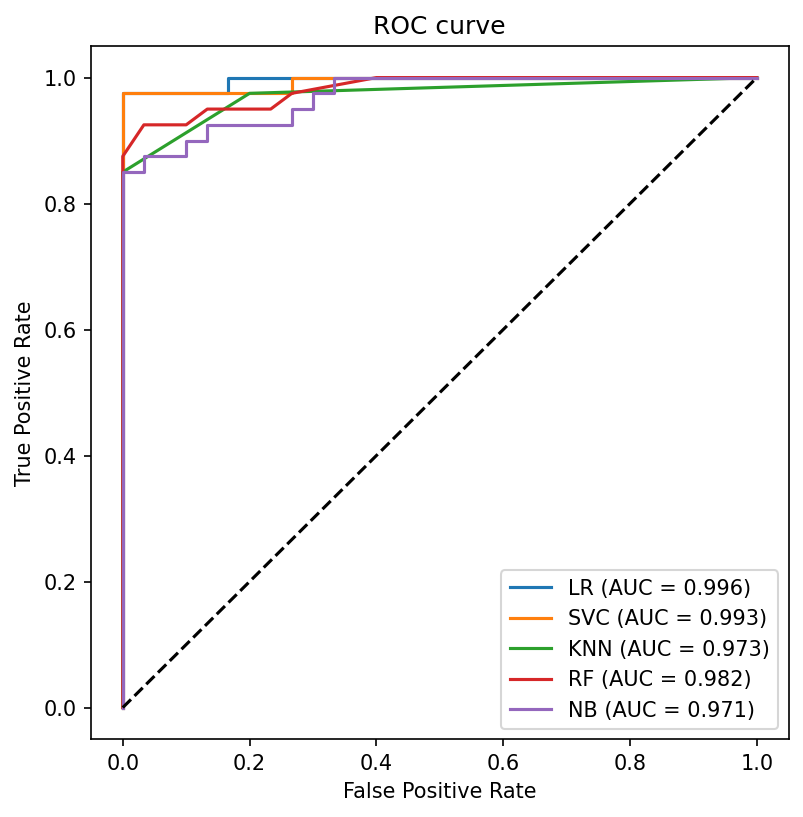

,Accuracy %,STD %,Recall %,STD %,Precision %,STD %,F1_score %,STD %
LR,95.8,6.76,96.18,6.54,93.91,8.97,94.91,7.06
SVC,97.2,5.90,97.45,5.66,95.18,8.73,96.18,6.54
KNN,91.6,7.23,92.36,7.31,90.09,8.49,91.09,7.06
RF,91.5,10.01,92.27,9.84,90.00,10.72,91.00,9.64
NB,90.1,9.67,91.00,9.64,88.73,10.24,89.73,9.25


In [40]:
# Test classifiers with selected features and top hyperparameters
test_classifiers(X_new_chosen, y, top_param, 'ROC')

# Continue with Logestic Regression Classifier and 23 features selected by Lasso

In [41]:
# Find best parameters for logistic Regression Classifier with just the selected features by Lasso
best_param = clf_h_p_opt(X_new_chosen, y)


Best parameters for all classifiers:

LR :
{'LR__C': 1.0, 'LR__penalty': 'l2', 'LR__solver': 'newton-cg'} 

SVC :
{'SvC__C': 0.1, 'SvC__kernel': 'linear'} 

KNN :
{'KNN__n_neighbors': 3} 

RF :
{'RF__max_depth': 10, 'RF__n_estimators': 10} 

NB :
{'NB__var_smoothing': 1.0} 



In [42]:
# Create LogisticRegression object and pipeline
LR = LogisticRegression(random_state=0)
pipe_LR = Pipeline([('scaler', StandardScaler()), ('LR', LR)])

# Assign best parameters for LR
pipe_LR.set_params(**best_param[0])

# Fit with the whole dataset (with selected features)
pipe_LR.fit(X_new_chosen, y.values.ravel())

# The model is ready to be used

Pipeline(steps=[('scaler', StandardScaler()),
                ('LR', LogisticRegression(random_state=0, solver='newton-cg'))])

# Predict status for patients in dataset 2

In [43]:
# Test of dataset 2 (Patient vs Normal)

X4 = X2[X_new_chosen.columns]

#Create new DataFrame for all patients in dataset 2
dataset_2_results = pd.DataFrame(data2[['Person', 'Progression', 'Period_rounded']])

#Add new column for binary prediction for all patients in dataset 2
dataset_2_results['Prediction'] = pipe_LR.predict(X4)

#Make some changes to column "Person"
dataset_2_results['Person'] = dataset_2_results['Person'].str.replace('Met_Fraction_', '')

#Export DataFrame dataset_2_results to csv file
dataset_2_results.to_csv('./results/1st_classification_dataset_2_results_LR', index=False)

dataset_2_results

,Person,Progression,Period_rounded,Prediction
0,P1_B2,0,1,1
1,P1_B3,0,2,1
2,P1_B4,0,3,1
3,P1_B5,0,4,1
4,P1_B6,0,5,0
...,...,...,...,...
212,P39_B3,0,2,1
213,P39_B4,0,3,1
214,P39_B5,0,4,1
215,P39_B6,1,5,1


### Accuracy of predition

In [44]:
print( np.round(len(dataset_2_results[ dataset_2_results['Prediction'] == 1 ]) / 
                len(dataset_2_results['Prediction']) * 100, 2), '%')

80.65 %


# Part 2 (Monitoring of ctDNA level)

# By new classifier Logistic Regression using 23 features selected by Lasso

## Predict the probability for all tests for patients in both datasets and create data frame for all patients

In [45]:
df_all = main_func(X_new_chosen, pipe_LR)

#Export Data Frame df_all to csv file
df_all.to_csv('./results/1st_classification_df_all_LR', index=False)

## Create a plot for all tests for each patient

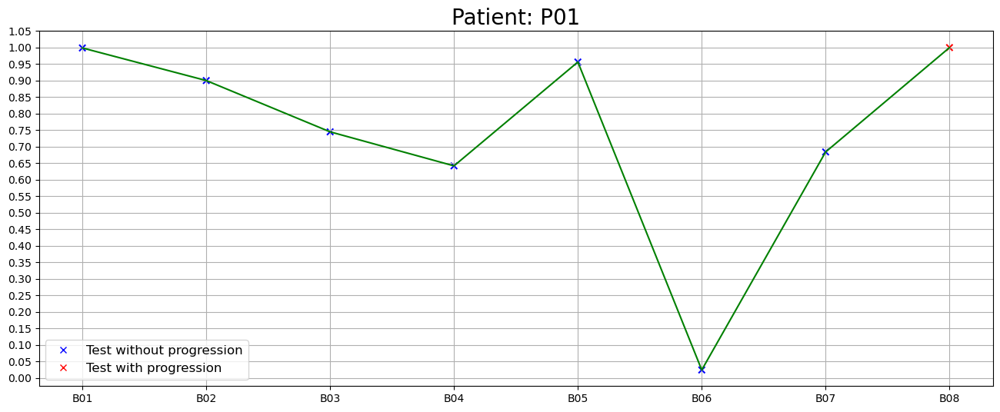

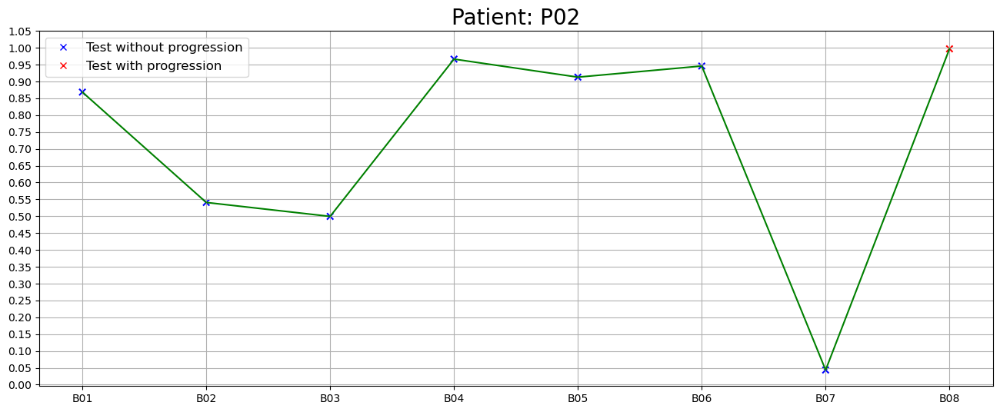

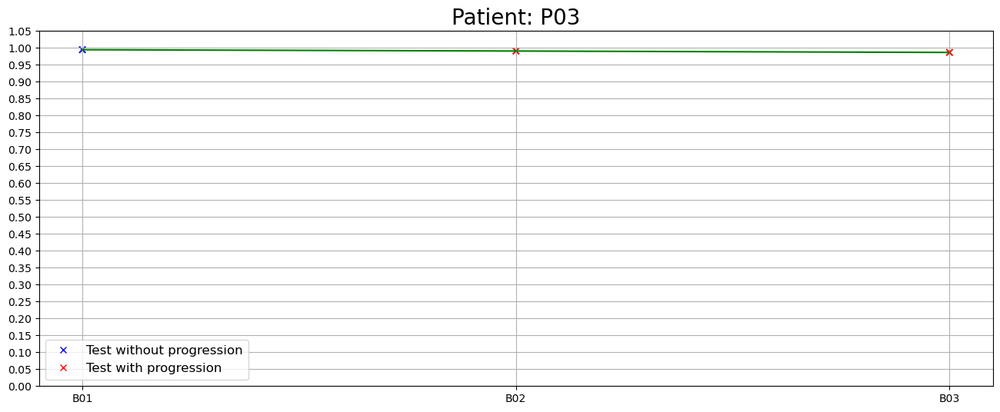

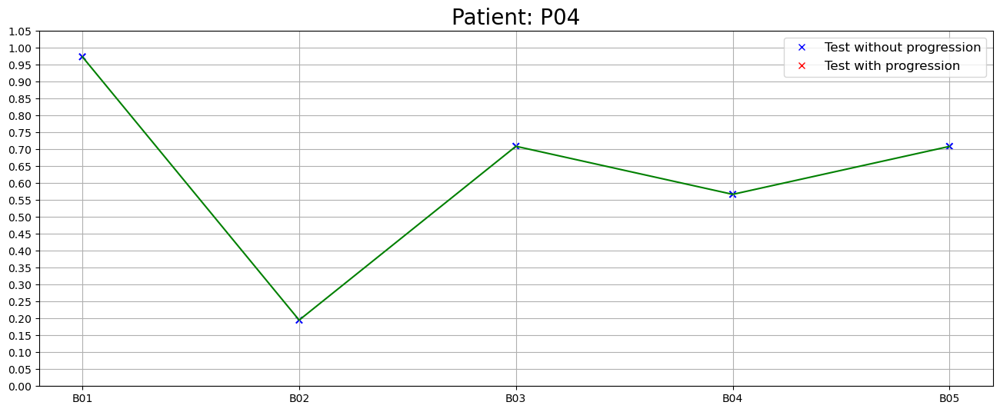

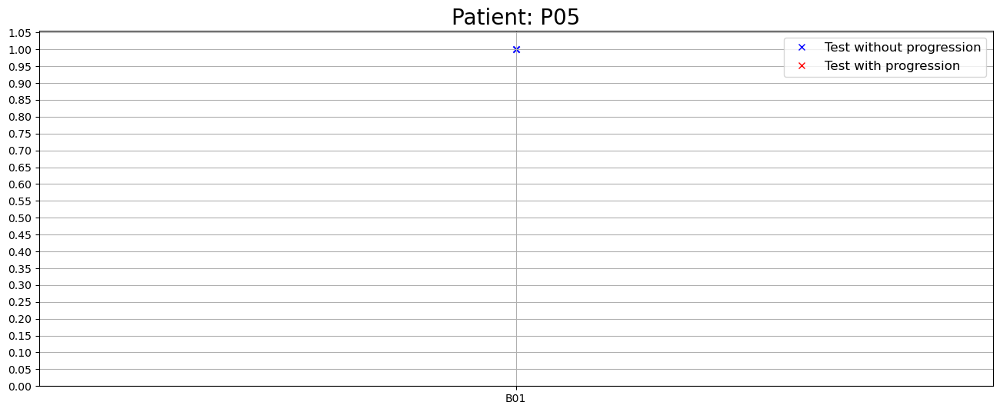

...

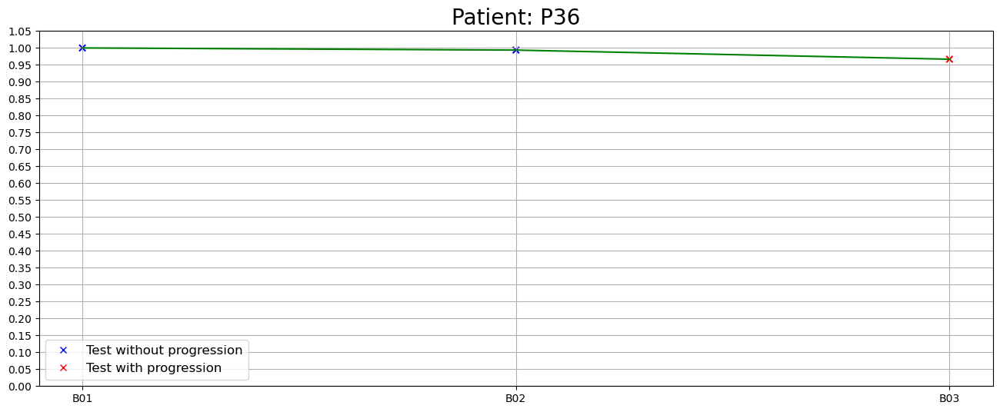

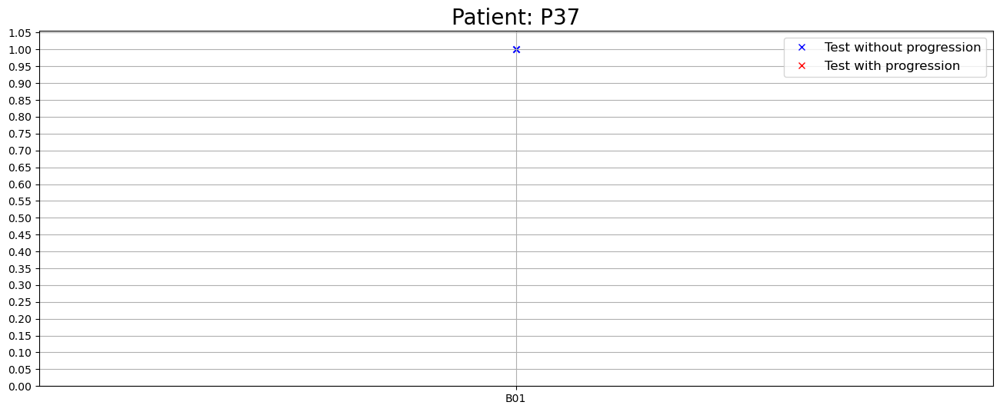

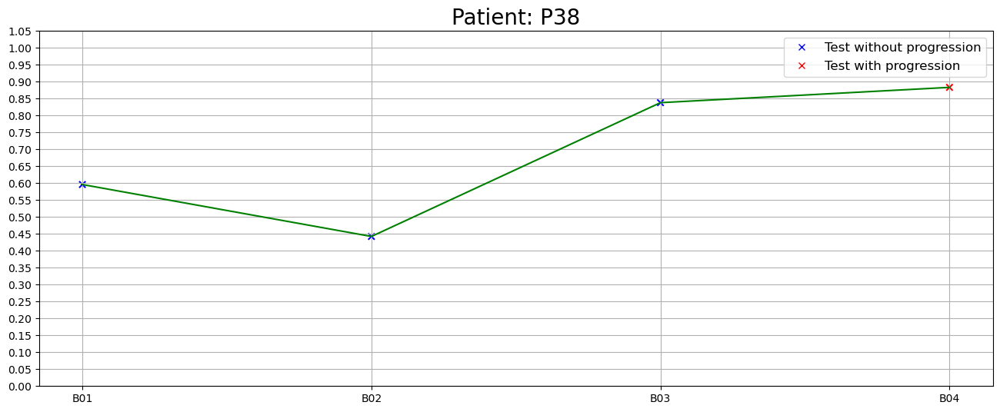

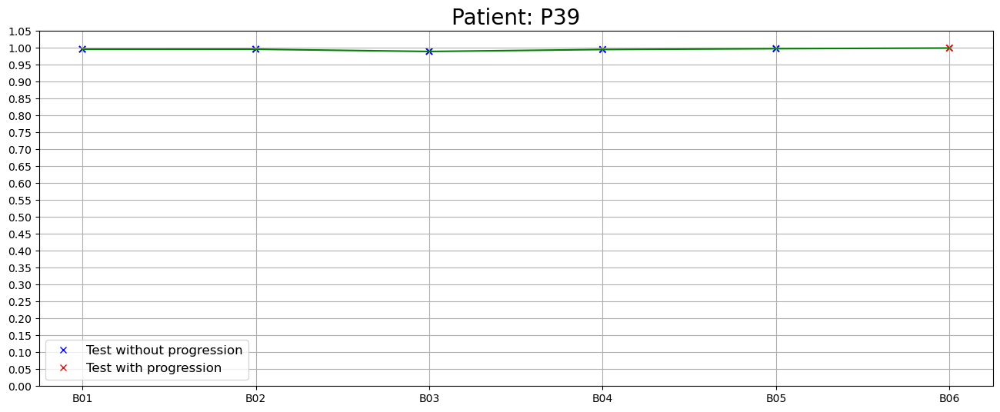

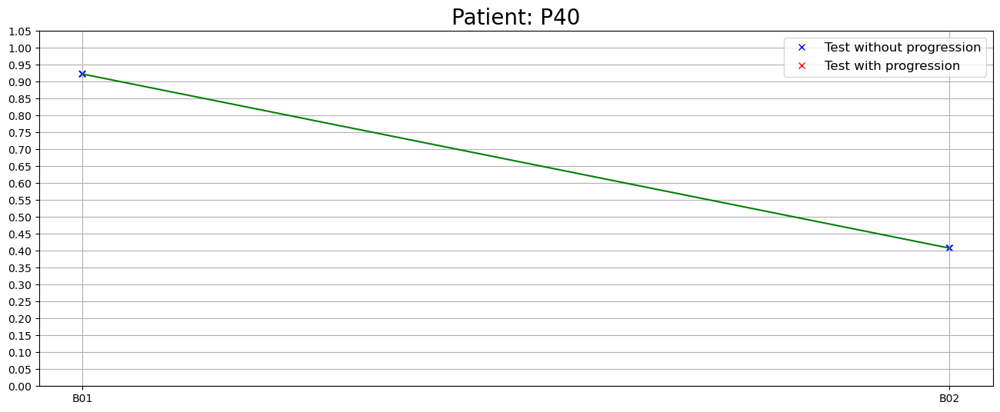

In [46]:
plot_each_patient(df_all)

## Create a plot for tests with first progression as reference point

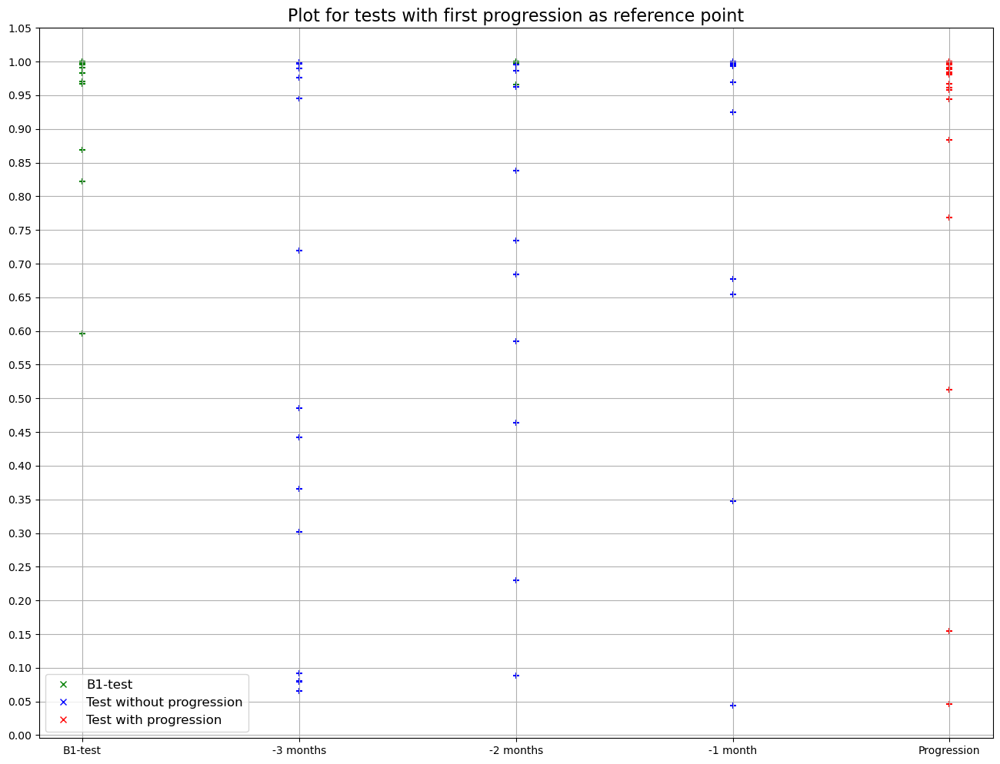

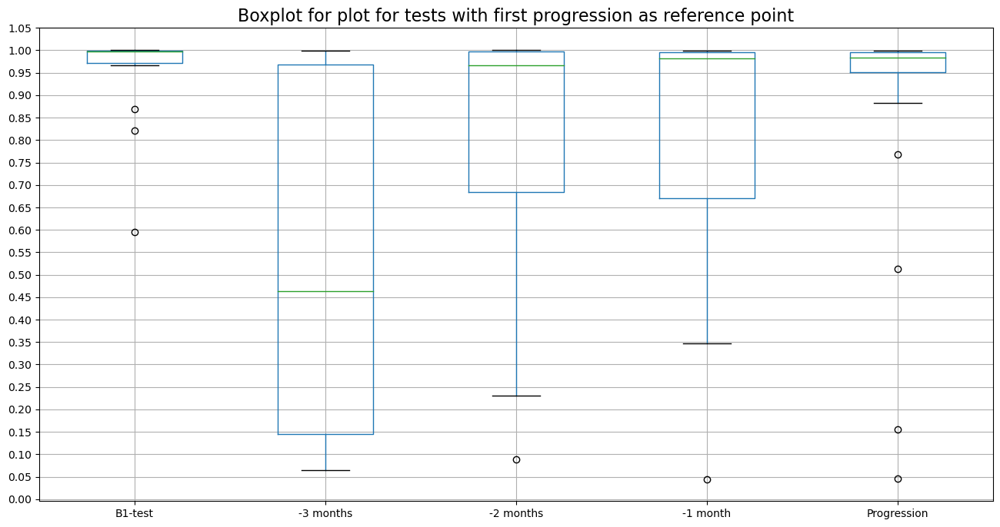

In [47]:
#Note: months_1 is the database for the created plots
months_1 = plot_1st_prog_ref(df_all)

In [48]:
months_1

,Person,B1-test place,B1-test,-3 m,-2 m,-1 m,Progression
0,P01,B1-test,0.998577,NaN,0.683755,NaN,0.999682
1,P02,B1-test,0.868506,0.945905,NaN,0.043496,0.996948
2,P03,-1 m,NaN,NaN,NaN,0.994553,0.99067
3,P09,B1-test,0.967208,0.975753,0.986701,0.999629,0.984453
4,P10,B1-test,0.999362,0.092027,0.734148,0.654333,0.961274
5,P11,B1-test,0.998827,0.484956,0.230292,0.67702,0.76864
6,P13,-2 m,NaN,NaN,0.99638,0.969296,0.990032
7,P15,B1-test,0.982858,0.365195,0.683564,NaN,0.995954
8,P16,B1-test,0.999602,0.080404,0.998868,NaN,0.989213
9,P17,B1-test,0.997563,0.30184,NaN,NaN,0.983353


## Wilcoxon Signed-Rank Test for first progression as reference point

In [49]:
wilcoxon_1st_prog(months_1)

,-3 months,-2 months,-1 month,Progression
B1-test,0.004028,0.024536,0.15625,0.104543
-3 months,,0.063965,0.375,0.006714
-2 months,,,0.845703,0.293499
-1 month,,,,0.518555


## Create a plot for patients tests with first test (B1-test) as reference point

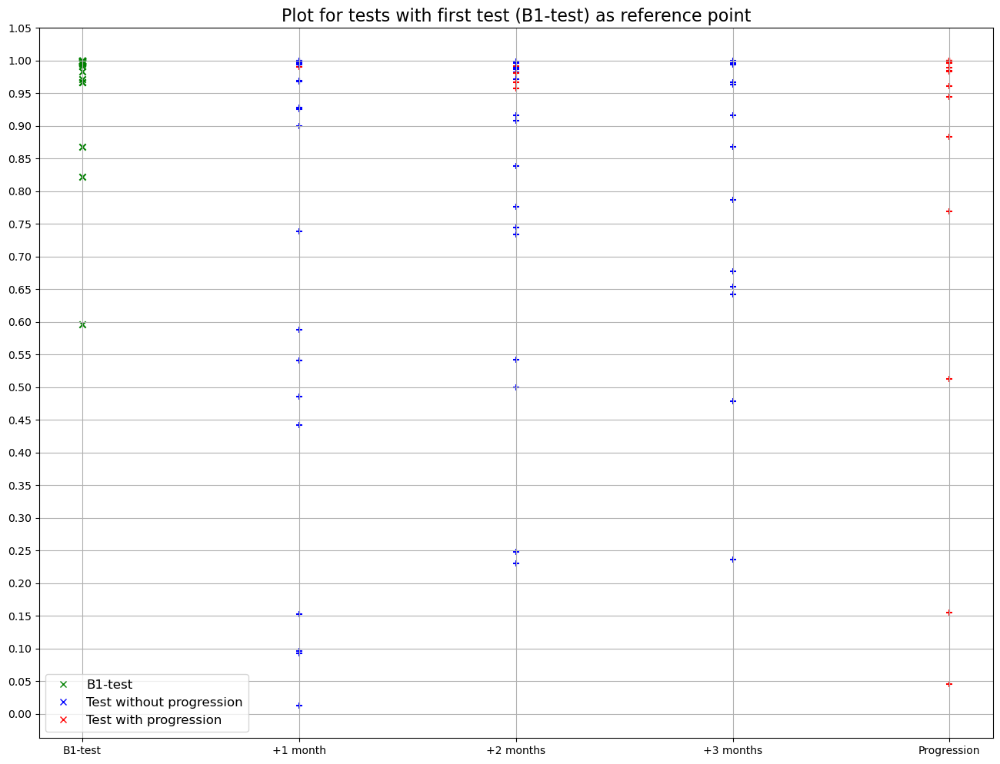

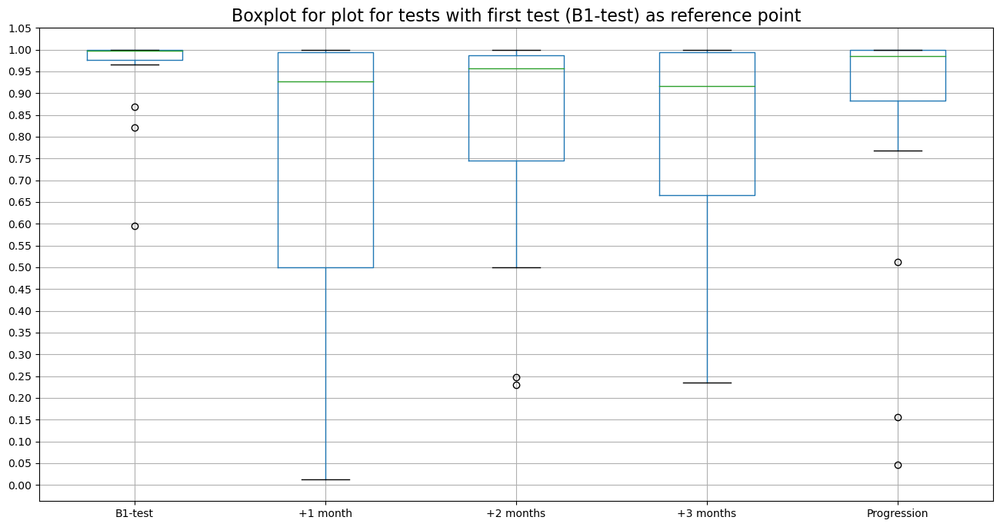

In [50]:
#Note: months_2 is the database for the created plots
months_2 = plot_B1_test_ref(df_all)

In [51]:
months_2

,Person,B1-test,+1 m,+2 m,+3 m,Progression,Progression place
0,P01,0.998577,0.899885,0.744638,0.641634,0.999682,Progression
1,P02,0.868506,0.540893,0.499523,0.966455,0.996948,Progression
2,P03,0.994553,0.99067,NaN,NaN,NaN,+1 m
3,P09,0.967208,0.997637,0.775629,0.78667,0.984453,Progression
4,P10,0.999362,0.092027,0.734148,0.654333,0.961274,Progression
5,P11,0.998827,0.484956,0.230292,0.67702,0.76864,Progression
6,P13,0.99638,0.969296,0.990032,NaN,NaN,+2 m
7,P15,0.982858,0.012164,0.908312,0.478328,0.995954,Progression
8,P16,0.999602,0.999446,0.996284,0.995632,0.989213,Progression
9,P17,0.997563,0.096465,0.542043,0.868366,0.983353,Progression


## Wilcoxon Signed-Rank Test for B1 test as reference point

In [52]:
wilcoxon_B1_test(months_2)

,+1 month,+2 months,+3 months,Progression
B1-test,0.000021,0.001859,0.005371,0.104543
+1 month,,0.216167,0.135376,0.098373
+2 months,,,0.678772,0.211426
+3 months,,,,0.488708


# (New trial) Test by Naive Bayes using 23 features selected by Lasso

In [53]:
# Create GaussianNB object and pipeline
NB = GaussianNB()
pipe_NB = Pipeline([('scaler', StandardScaler()), ('NB', NB)])

# Assign best parameters for NB
pipe_NB.set_params(**best_param[4])

# Fit with the whole dataset (with selected features)
pipe_NB.fit(X_new_chosen, y.values.ravel())

# The model is ready to be used

Pipeline(steps=[('scaler', StandardScaler()),
                ('NB', GaussianNB(var_smoothing=1.0))])

## Predict the probability for all tests for patients in both datasets and create data frame for all patients

In [54]:
df_all = main_func(X_new_chosen, pipe_NB)

#Export DataFrame df_all to csv file
df_all.to_csv('./results/1st_classification_df_all_NB', index=False)

## Create a plot for all tests for each patient

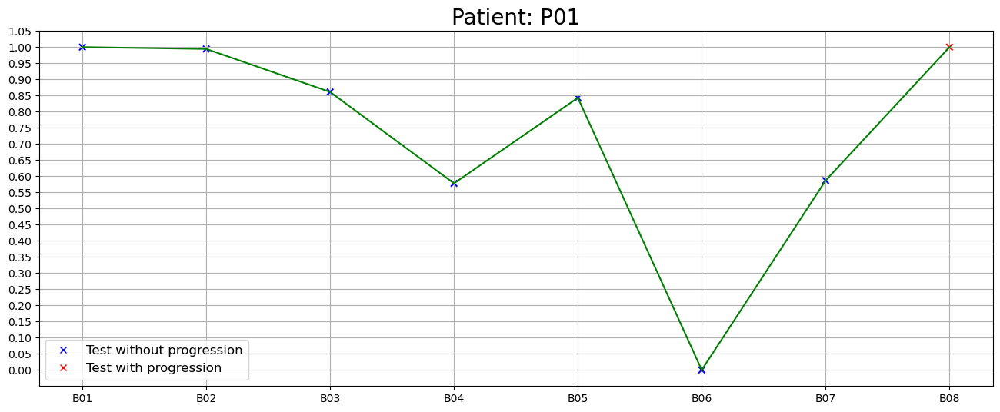

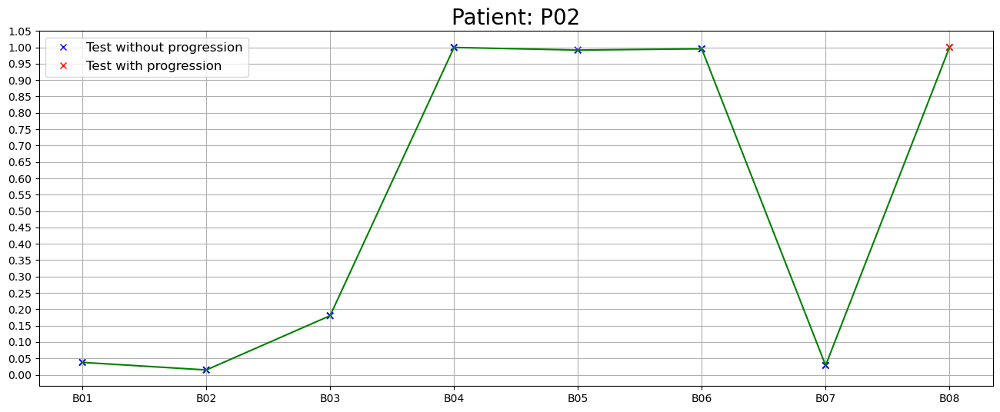

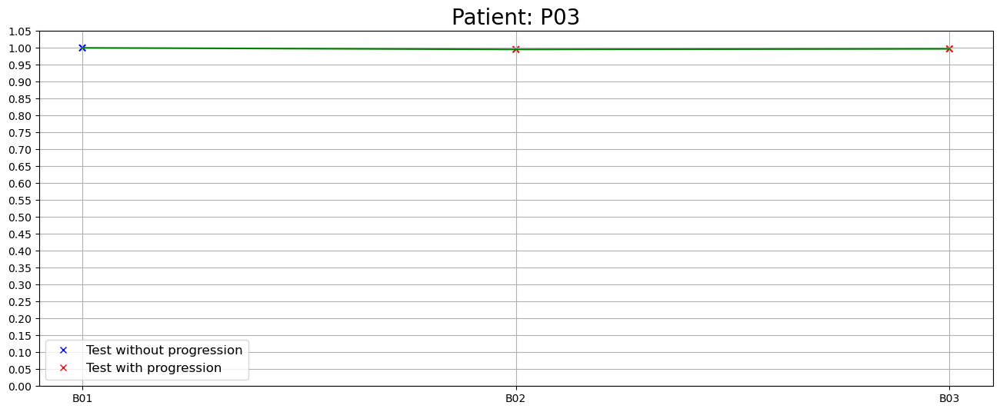

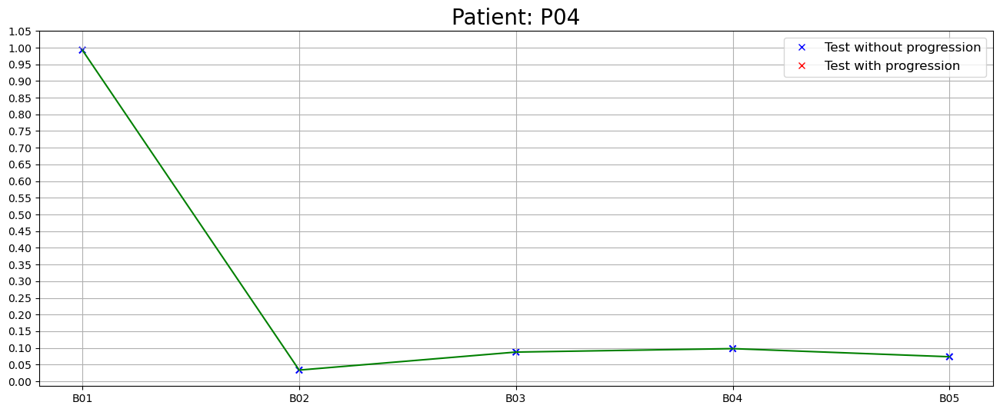

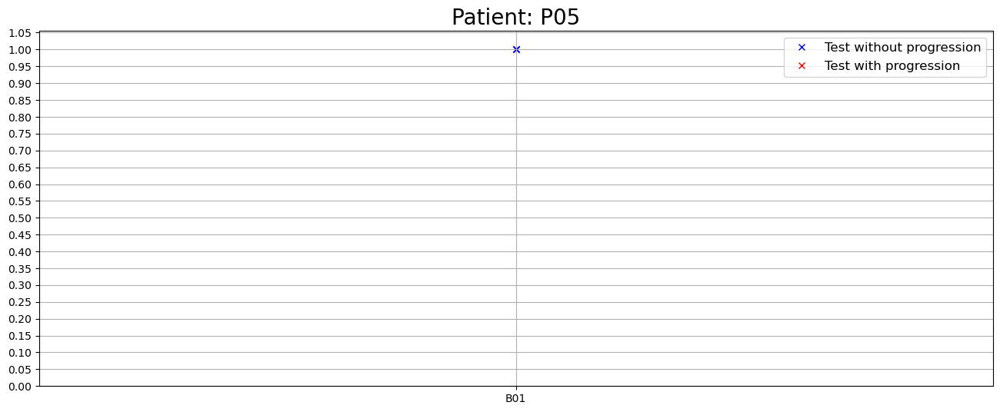

...

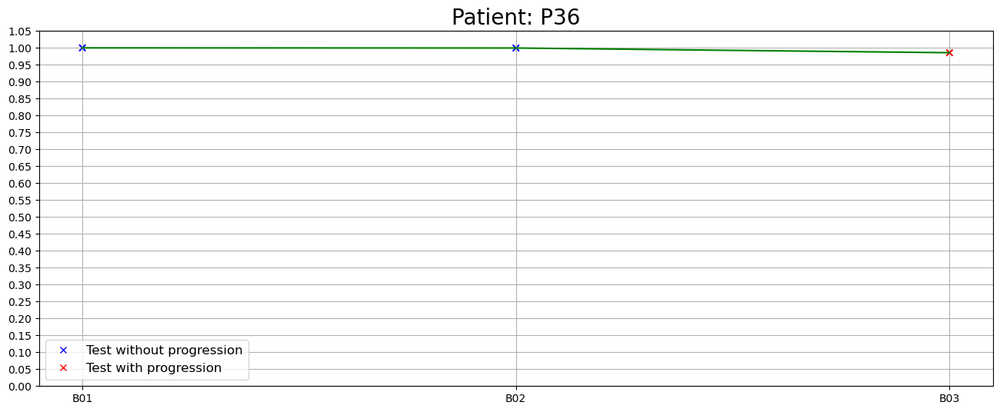

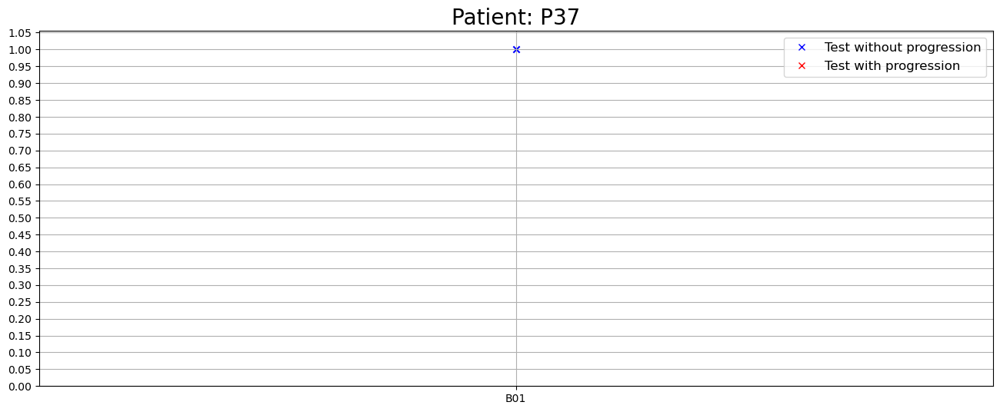

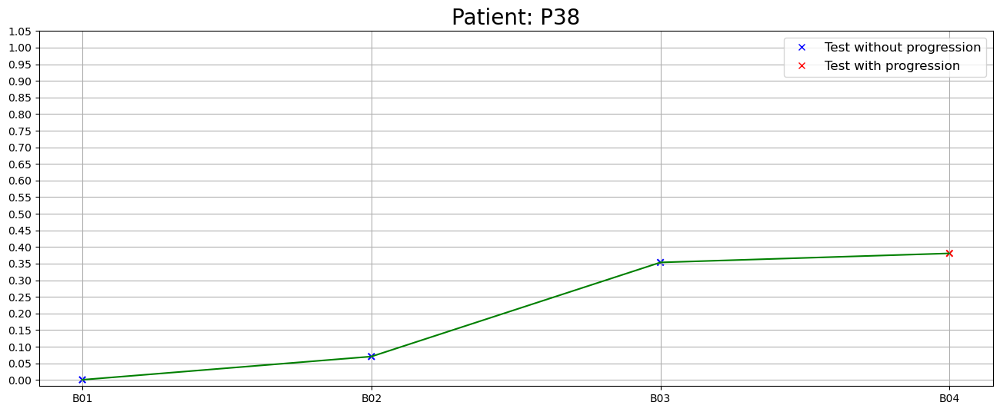

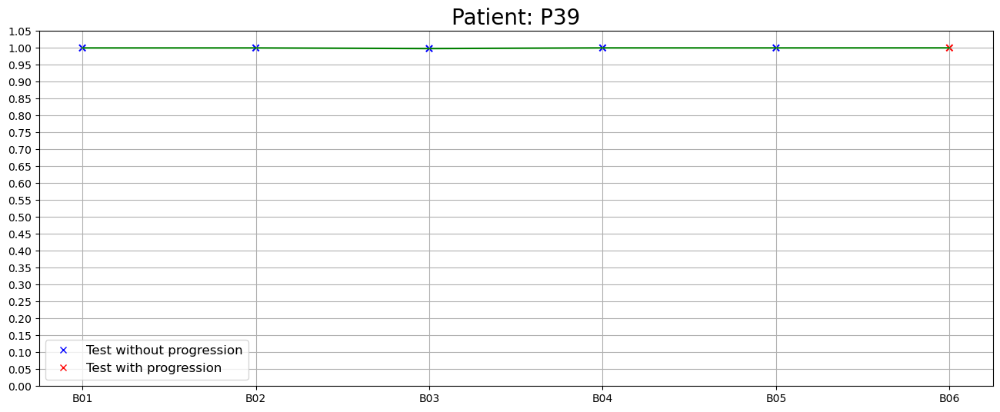

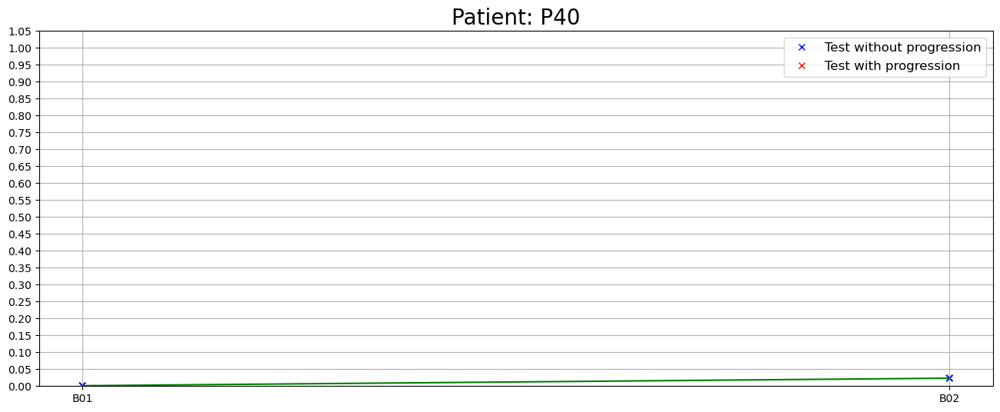

In [55]:
plot_each_patient(df_all)

## Plot for tests with first progression as reference point

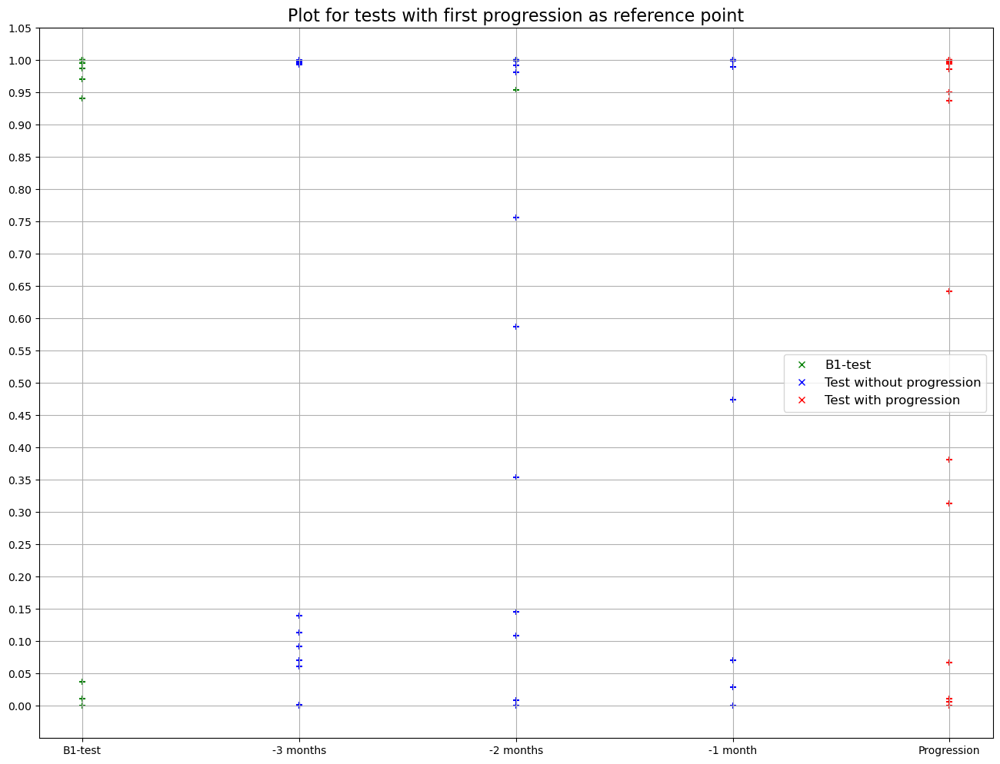

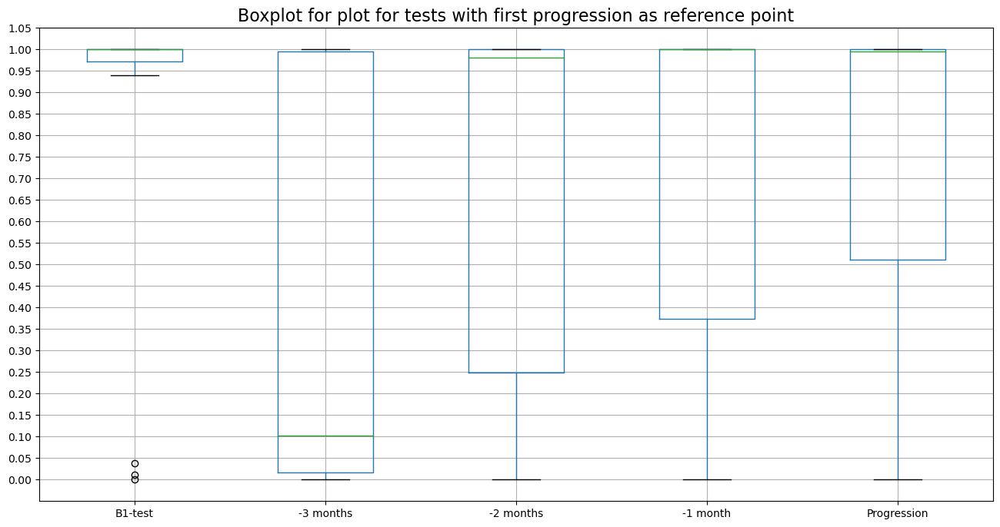

In [56]:
#Note: months_1 is the database for the created plots
months_1 = plot_1st_prog_ref(df_all)

In [57]:
months_1

,Person,B1-test place,B1-test,-3 m,-2 m,-1 m,Progression
0,P01,B1-test,1.0,NaN,0.586871,NaN,1.0
1,P02,B1-test,0.037748,0.995384,NaN,0.028413,0.999995
2,P03,-1 m,NaN,NaN,NaN,0.999985,0.995428
3,P09,B1-test,0.940354,0.992616,0.992446,0.999999,0.950807
4,P10,B1-test,0.999999,0.00079,0.108531,0.071109,0.937405
5,P11,B1-test,0.99998,0.113281,0.000267,0.000061,0.011202
6,P13,-2 m,NaN,NaN,0.999916,0.999877,0.999526
7,P15,B1-test,0.971154,0.091881,0.755771,NaN,0.999763
8,P16,B1-test,1.0,0.000046,0.999925,NaN,0.999276
9,P17,B1-test,0.996066,0.139384,NaN,NaN,0.997089


## Wilcoxon Signed-Rank Test for first progression as reference point

In [58]:
wilcoxon_1st_prog(months_1)

,-3 months,-2 months,-1 month,Progression
B1-test,0.090576,0.090576,0.15625,0.259452
-3 months,,0.109863,0.8125,0.057983
-2 months,,,0.322266,0.890568
-1 month,,,,0.62207


## Create a plot for patients tests with first test (B1 test) as reference point

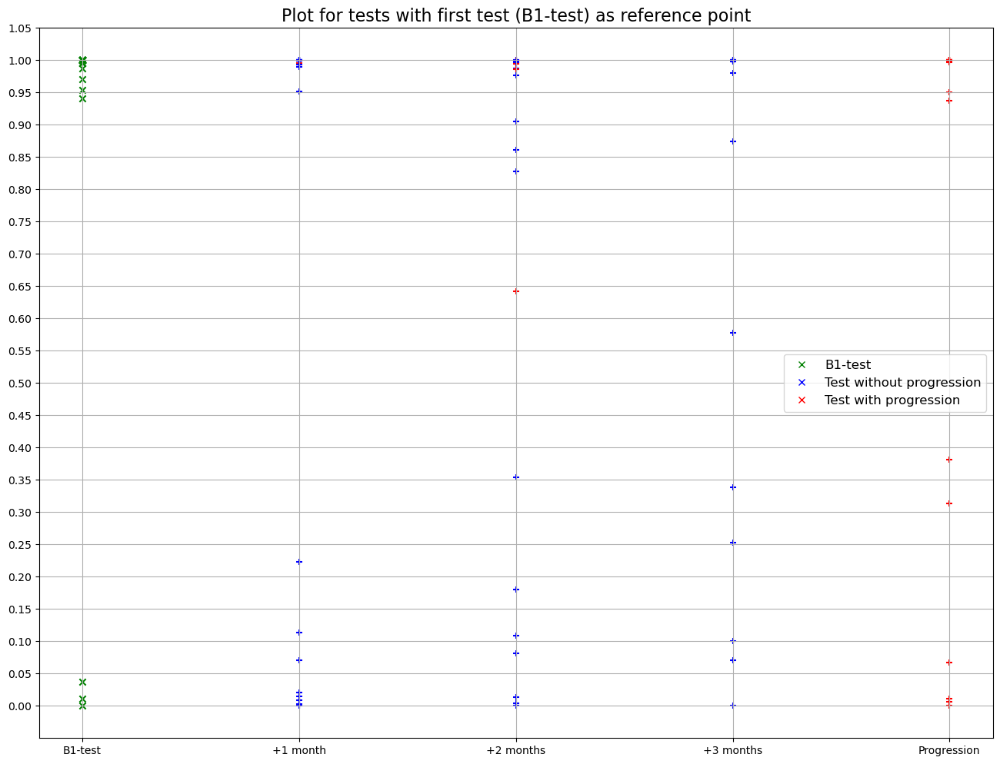

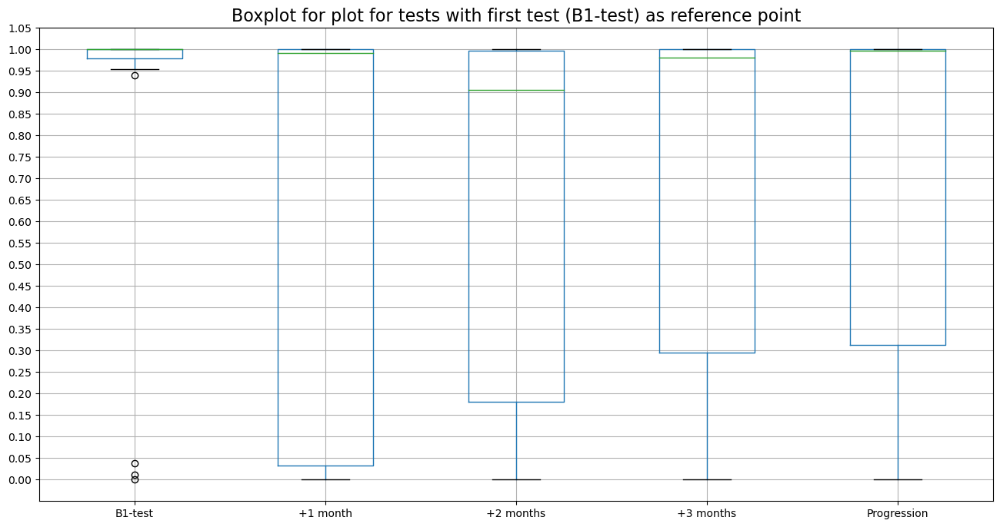

In [59]:
#Note: months_2 is the database for the created plots
months_2 = plot_B1_test_ref(df_all)

In [60]:
months_2

,Person,B1-test,+1 m,+2 m,+3 m,Progression,Progression place
0,P01,1.0,0.994266,0.861031,0.578062,1.0,Progression
1,P02,0.037748,0.014628,0.180364,0.999649,0.999995,Progression
2,P03,0.999985,0.995428,NaN,NaN,NaN,+1 m
3,P09,0.940354,0.999952,0.081297,0.874589,0.950807,Progression
4,P10,0.999999,0.00079,0.108531,0.071109,0.937405,Progression
5,P11,0.99998,0.113281,0.000267,0.000061,0.011202,Progression
6,P13,0.999916,0.999877,0.999526,NaN,NaN,+2 m
7,P15,0.971154,0.000004,0.827128,0.253235,0.999763,Progression
8,P16,1.0,0.999966,0.999998,0.999958,0.999276,Progression
9,P17,0.996066,0.003166,0.013086,0.338009,0.997089,Progression


## Wilcoxon Signed-Rank Test for B1 test as reference point

In [61]:
wilcoxon_B1_test(months_2)

,+1 month,+2 months,+3 months,Progression
B1-test,0.005929,0.019473,0.135376,0.259452
+1 month,,0.840822,0.207764,0.224686
+2 months,,,0.389404,0.252228
+3 months,,,,0.719727


# Try new method; Lasso features with lowest p_value

In [62]:
p_value = []

for i in np.arange(features_lasso.index.size):
    p_value.append(float(T_test_rev01(X[[features_lasso.iloc[i,0]]])))

p_value_features = features_lasso
p_value_features['p_value'] = p_value
p_value_features = p_value_features.sort_values(by='p_value')

p_value_features.head(20)

,Feature,Appearance %,p_value
10,Var-285,80.0,1.905463e-13
15,Var-277,70.0,1.240702e-11
42,Var-146,10.0,2.325940e-11
21,Var-18,60.0,2.366458e-11
6,Var-331,90.0,2.962019e-11
36,Var-81,10.0,3.012899e-11
18,Var-326,70.0,4.893776e-11
44,Var-332,10.0,7.691297e-11
16,Var-297,70.0,2.007100e-10
20,Var-114,60.0,3.422573e-10


In [63]:
X_new_p_value = X[(p_value_features.iloc[0:8,:]['Feature'].to_list())]

X_new_p_value

,Var-285,Var-277,Var-146,Var-18,Var-331,Var-81,Var-326,Var-332
0,1.713273,1.273357,1.236446,1.345761,1.832512,1.043743,1.229259,0.822273
1,1.416933,1.132770,0.497826,0.000000,1.420201,0.947563,0.000000,0.988488
2,1.638334,0.989425,1.162389,1.129140,1.546229,0.819700,1.101474,1.035362
3,1.398406,0.676668,1.036165,1.088126,1.713776,0.739692,1.028859,0.691229
4,1.871496,1.482629,1.721003,0.000000,2.273336,1.544884,1.618218,1.451304
...,...,...,...,...,...,...,...,...
65,0.632483,0.000000,0.000000,0.480394,0.000000,0.000000,0.000000,0.558396
66,0.000000,0.610672,0.000000,0.000000,0.000000,0.519770,0.539351,0.000000
67,0.000000,0.000000,1.331328,0.000000,1.062838,0.000000,1.159601,0.000000
68,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.418069


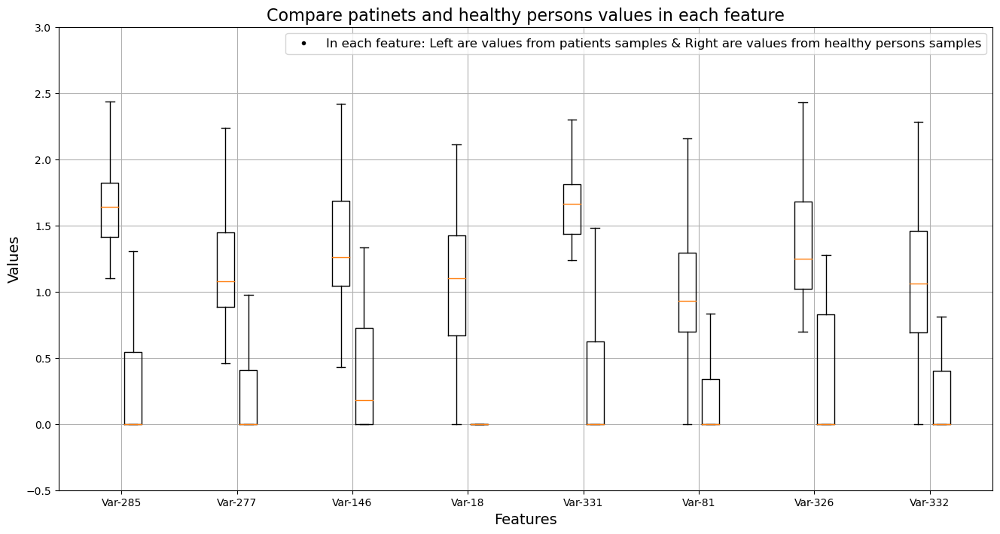

In [64]:
#Boxplot for patients values and healthy people values in each feature
chosen_features(X_new_p_value)

# Leave-one-out Evaluation (Lasso features)

Sample to be predicted is :  [26] and accuracy is: 100.00%
Sample to be predicted is :  [27] and accuracy is: 100.00%
Sample to be predicted is :  [48] and accuracy is: 100.00%
Sample to be predicted is :  [22] and accuracy is: 100.00%
Sample to be predicted is :  [30] and accuracy is: 100.00%
Sample to be predicted is :  [51] and accuracy is: 100.00%
Sample to be predicted is :  [7] and accuracy is: 100.00%
Sample to be predicted is :  [59] and accuracy is: 100.00%
Sample to be predicted is :  [34] and accuracy is: 100.00%
Sample to be predicted is :  [69] and accuracy is: 100.00%
Sample to be predicted is :  [56] and accuracy is: 100.00%
Sample to be predicted is :  [28] and accuracy is: 100.00%
Sample to be predicted is :  [31] and accuracy is: 100.00%
Sample to be predicted is :  [42] and accuracy is: 100.00%
Sample to be predicted is :  [33] and accuracy is: 100.00%
Sample to be predicted is :  [55] and accuracy is: 100.00%
Sample to be predicted is :  [68] and accuracy is: 100.00

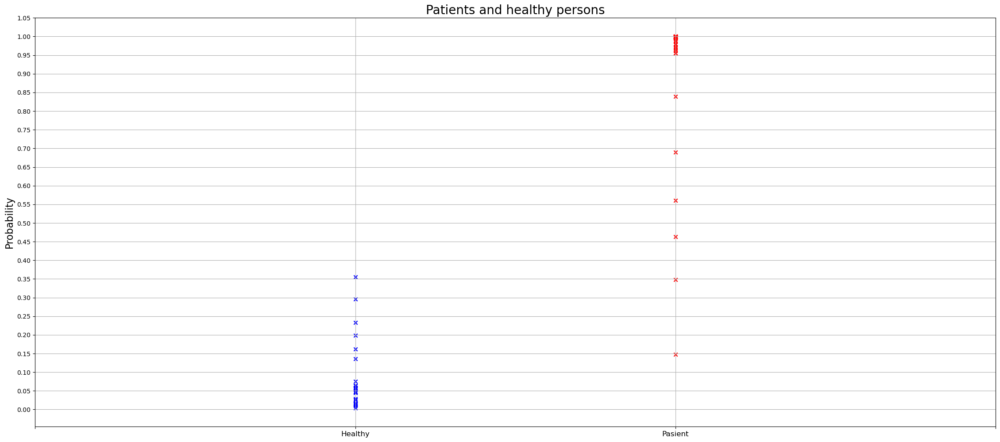

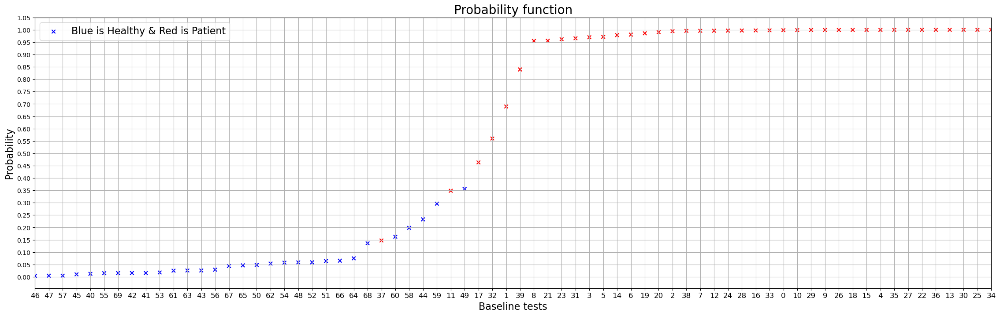

In [65]:
Leave_one_out(X_new_chosen, y, pipe_LR)

# Leave-one-out Evaluation (lowest p_value features)

In [66]:
# Find best parameters for Classifiers with new selected features 
best_param_2 = clf_h_p_opt(X_new_p_value, y)


Best parameters for all classifiers:

LR :
{'LR__C': 0.01, 'LR__penalty': 'l2', 'LR__solver': 'liblinear'} 

SVC :
{'SvC__C': 0.01, 'SvC__kernel': 'linear'} 

KNN :
{'KNN__n_neighbors': 6} 

RF :
{'RF__max_depth': 10, 'RF__n_estimators': 10} 

NB :
{'NB__var_smoothing': 1.0} 



Sample to be predicted is :  [26] and accuracy is: 100.00%
Sample to be predicted is :  [27] and accuracy is: 100.00%
Sample to be predicted is :  [48] and accuracy is: 100.00%
Sample to be predicted is :  [22] and accuracy is: 100.00%
Sample to be predicted is :  [30] and accuracy is: 100.00%
Sample to be predicted is :  [51] and accuracy is: 100.00%
Sample to be predicted is :  [7] and accuracy is: 100.00%
Sample to be predicted is :  [59] and accuracy is: 100.00%
Sample to be predicted is :  [34] and accuracy is: 100.00%
Sample to be predicted is :  [69] and accuracy is: 100.00%
Sample to be predicted is :  [56] and accuracy is: 100.00%
Sample to be predicted is :  [28] and accuracy is: 100.00%
Sample to be predicted is :  [31] and accuracy is: 100.00%
Sample to be predicted is :  [42] and accuracy is: 100.00%
Sample to be predicted is :  [33] and accuracy is: 100.00%
Sample to be predicted is :  [55] and accuracy is: 100.00%
Sample to be predicted is :  [68] and accuracy is: 100.00

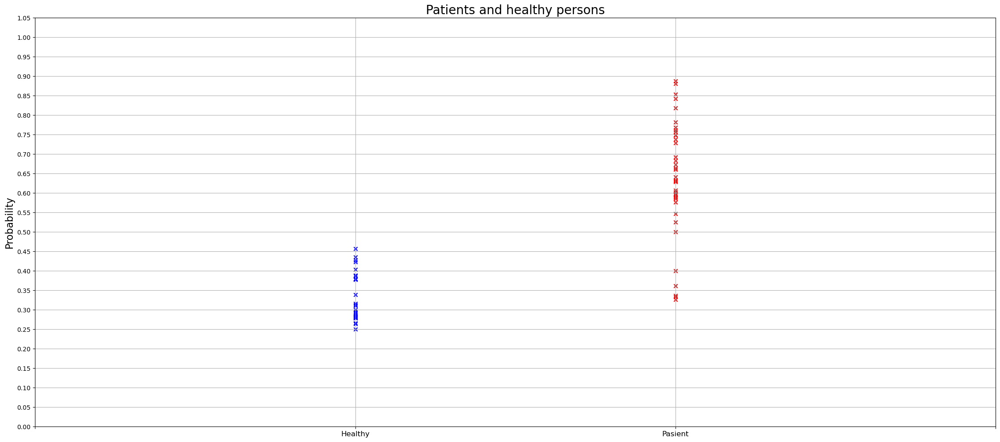

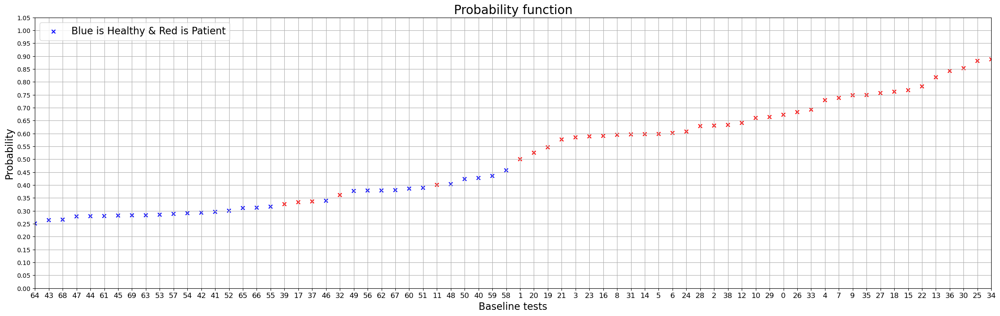

In [67]:
# Create LogisticRegression object and pipeline
LR = LogisticRegression(random_state=0)
pipe_LR_2 = Pipeline([('scaler', StandardScaler()), ('LR', LR)])

# Assign best parameters for LR
pipe_LR_2.set_params(**best_param_2[0])

# Leave-one-out Evaluation (lowest p_value features)
Leave_one_out(X_new_p_value, y, pipe_LR_2)

# New evaluation of classifiers

In [68]:
# Find best parameters for Classifiers with new selected features
best_param_2 = clf_h_p_opt(X_new_p_value, y)


Best parameters for all classifiers:

LR :
{'LR__C': 0.01, 'LR__penalty': 'l2', 'LR__solver': 'liblinear'} 

SVC :
{'SvC__C': 0.01, 'SvC__kernel': 'linear'} 

KNN :
{'KNN__n_neighbors': 6} 

RF :
{'RF__max_depth': 10, 'RF__n_estimators': 10} 

NB :
{'NB__var_smoothing': 1.0} 



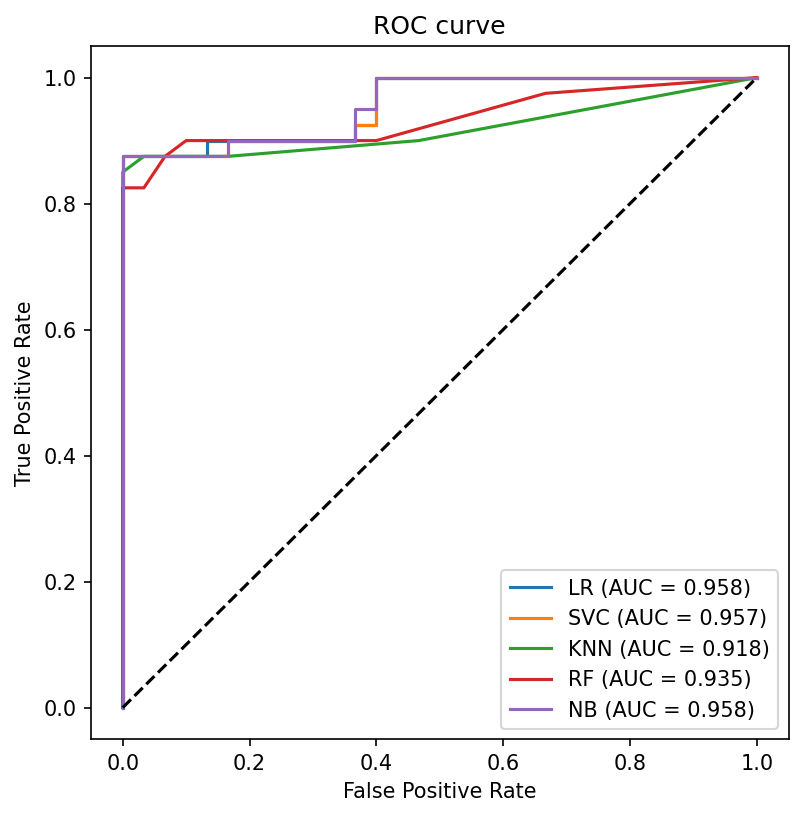

,Accuracy %,STD %,Recall %,STD %,Precision %,STD %,F1_score %,STD %
LR,93.0,7.38,93.64,7.31,91.36,8.86,92.36,7.31
SVC,91.5,10.01,92.27,9.84,90.00,10.72,91.00,9.64
KNN,91.6,7.23,92.36,7.31,90.09,8.49,91.09,7.06
RF,90.1,9.67,91.00,9.64,88.73,10.24,89.73,9.25
NB,93.0,7.38,93.64,7.31,91.36,8.86,92.36,7.31


In [69]:
# Test classifiers with new selected features
test_classifiers(X_new_p_value, y, best_param_2, 'ROC')

# Decided to continue with: Random Forest Classifier

# Random Forest Classifier

In [70]:
# Create RandomForestClassifier object and pipeline
RF = RandomForestClassifier(random_state=0)
pipe_RF = Pipeline([('scaler', StandardScaler()), ('RF', RF)])

# Assign best parameters for RF
pipe_RF.set_params(**best_param_2[3])

# Fit with the whole dataset (with selected features)
pipe_RF.fit(X_new_p_value, y.values.ravel())

# The model is ready to be used

Pipeline(steps=[('scaler', StandardScaler()),
                ('RF',
                 RandomForestClassifier(max_depth=10, n_estimators=10,
                                        random_state=0))])

# Predict status for patients in dataset 2

In [71]:
# Test of dataset 2 (Patient vs Normal)

X4 = X2[X_new_p_value.columns]

#Create new DataFrame for all patients in dataset 2
dataset_2_results = pd.DataFrame(data2[['Person', 'Progression', 'Period_rounded']])

#Add new column for binary prediction for all patients in dataset 2
dataset_2_results['Prediction'] = pipe_RF.predict(X4)

#Make some changes to column "Person"
dataset_2_results['Person'] = dataset_2_results['Person'].str.replace('Met_Fraction_', '')

#Export DataFrame dataset_2_results to csv file
dataset_2_results.to_csv('./results/1st_classification_dataset_2_results_RF', index=False)

dataset_2_results

,Person,Progression,Period_rounded,Prediction
0,P1_B2,0,1,1
1,P1_B3,0,2,1
2,P1_B4,0,3,1
3,P1_B5,0,4,0
4,P1_B6,0,5,0
...,...,...,...,...
212,P39_B3,0,2,1
213,P39_B4,0,3,1
214,P39_B5,0,4,1
215,P39_B6,1,5,1


### Accuracy of predition

In [72]:
print( np.round(len(dataset_2_results[ dataset_2_results['Prediction'] == 1 ]) / 
                len(dataset_2_results['Prediction']) * 100, 2), '%')

70.05 %


# New monitoring of ctDNA level by Random Forest classifier #######

## Predict the probability for all tests for patients in both datasets and create data frame for all patients

In [73]:
df_all = main_func(X_new_p_value, pipe_RF)

#Export Data Frame df_all to csv file
df_all.to_csv('./results/1st_classification_df_all_RF', index=False)

## Create a plot for all tests for each patient

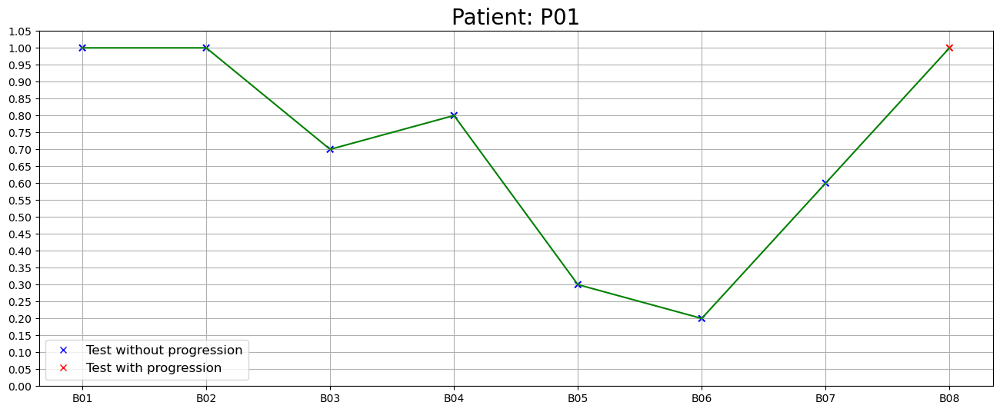

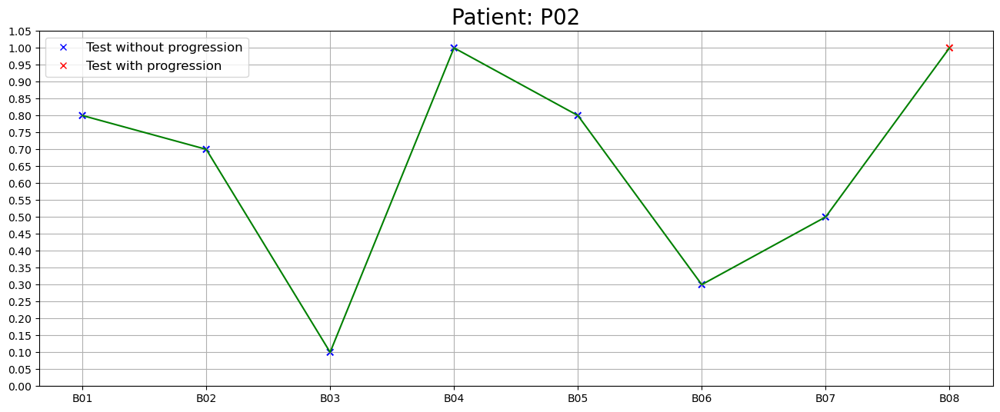

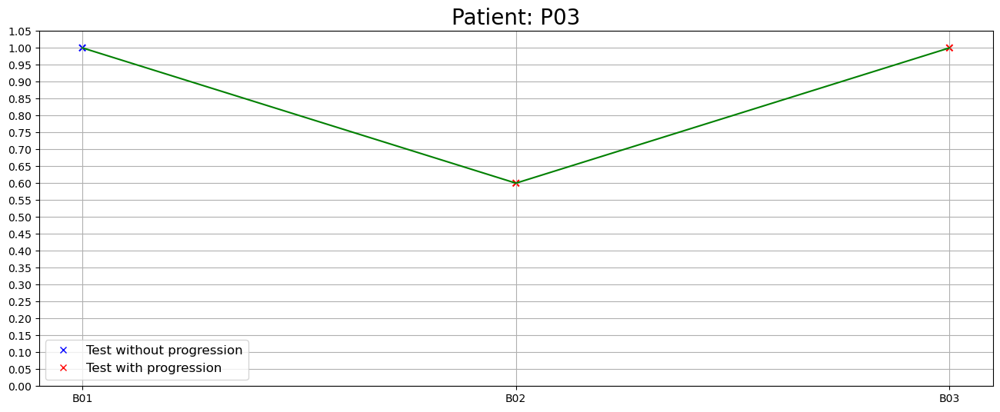

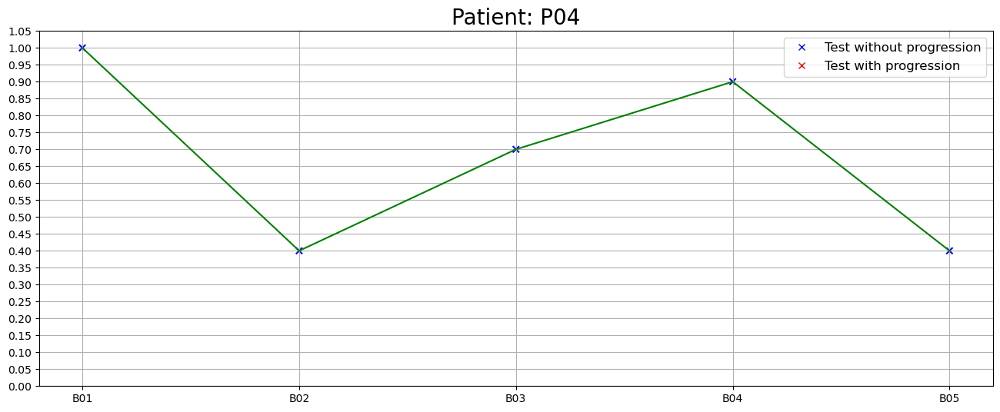

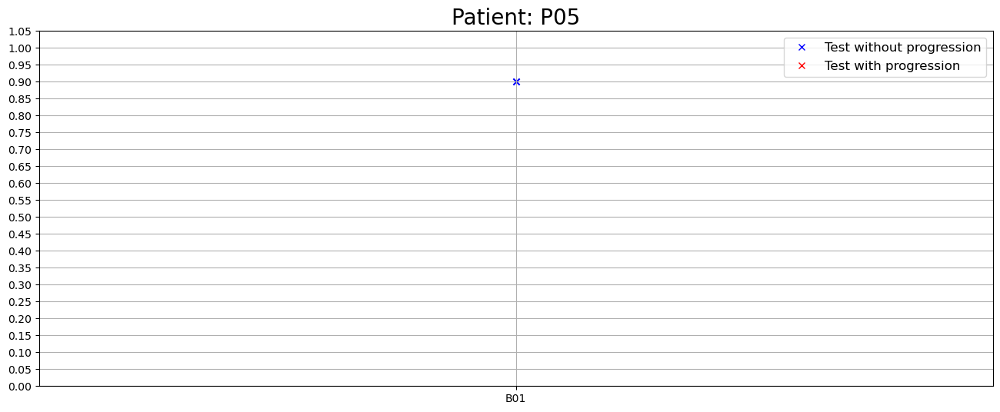

...

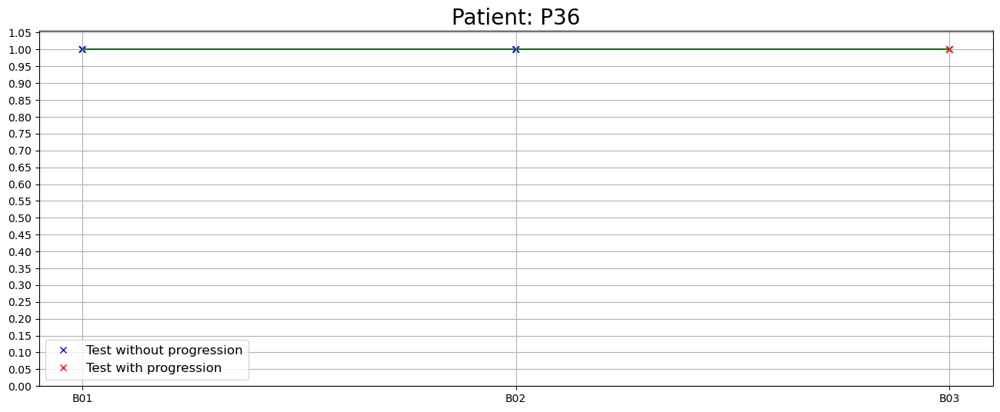

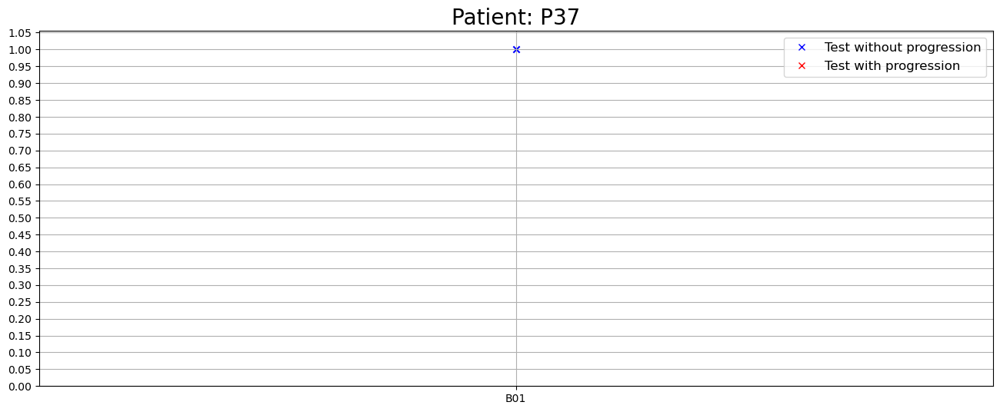

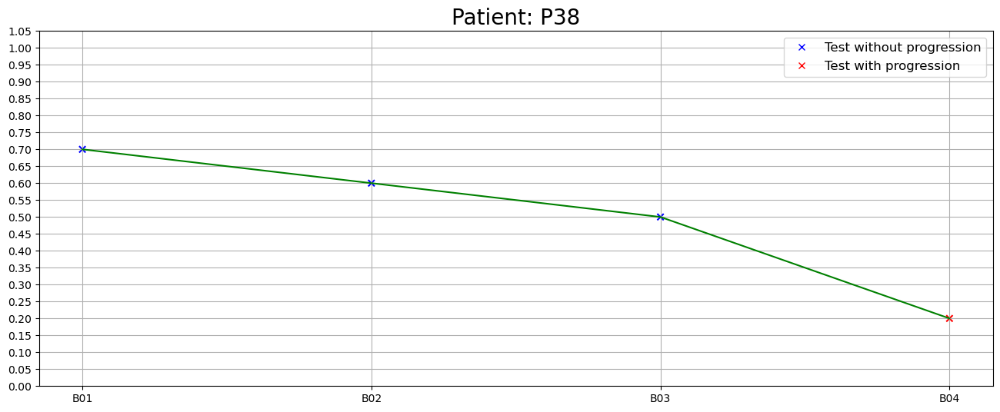

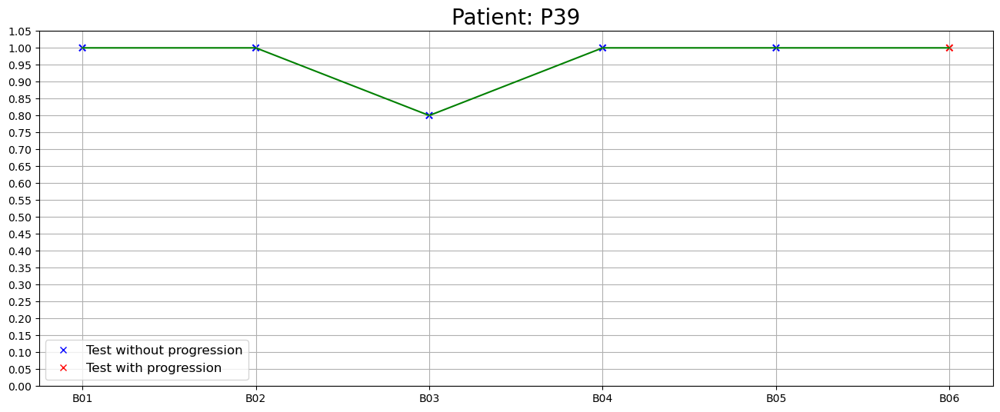

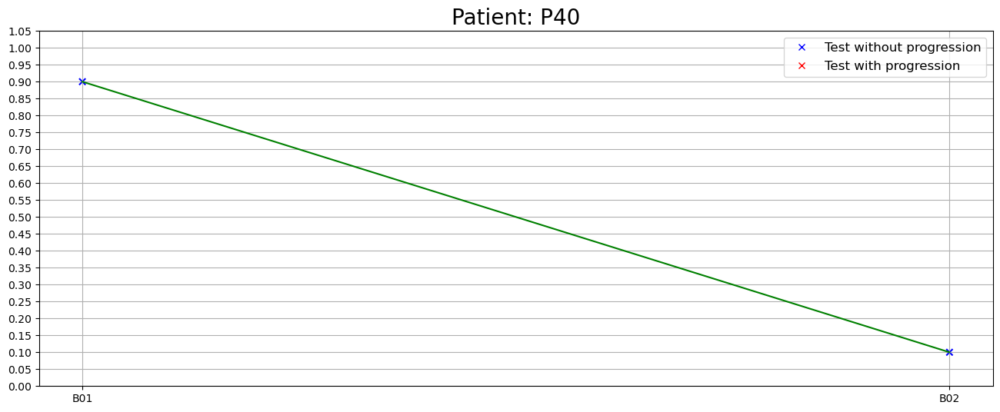

In [74]:
plot_each_patient(df_all)

## Plot for tests with first progression as reference point

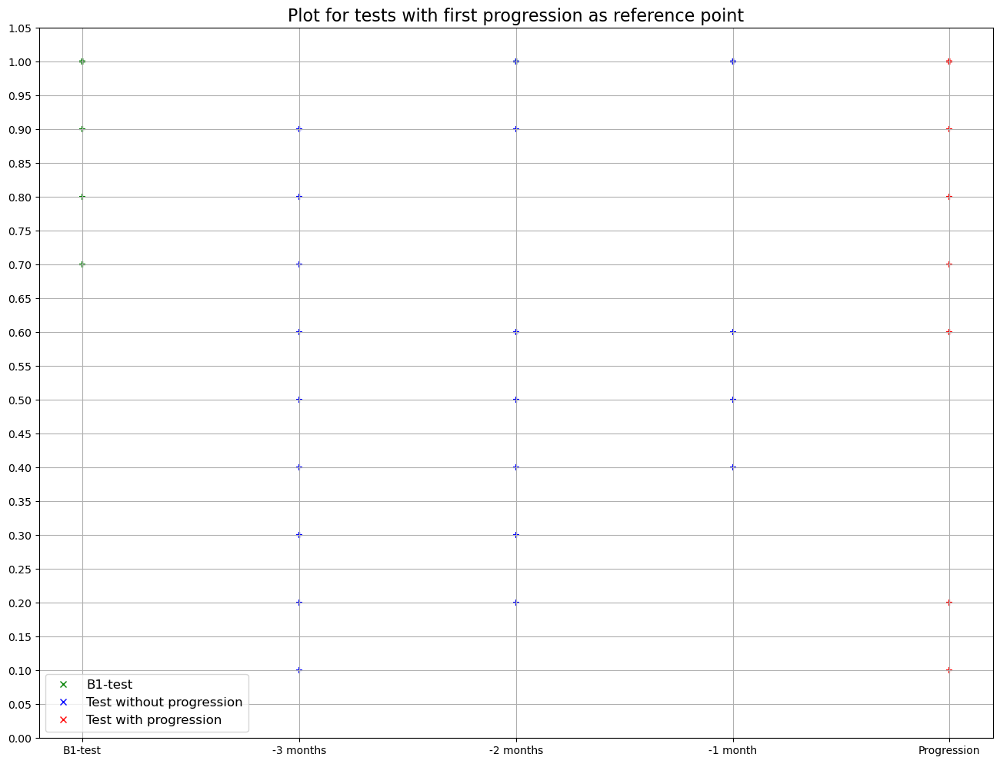

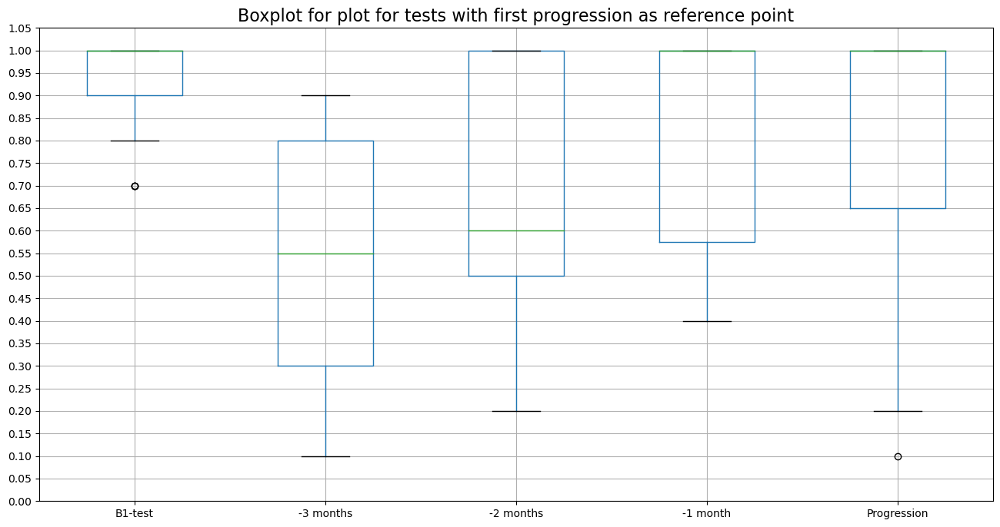

In [75]:
#Note: months_1 is the database for the created plots
months_1 = plot_1st_prog_ref(df_all)

In [76]:
months_1

,Person,B1-test place,B1-test,-3 m,-2 m,-1 m,Progression
0,P01,B1-test,1.0,NaN,0.6,NaN,1.0
1,P02,B1-test,0.8,0.3,NaN,0.5,1.0
2,P03,-1 m,NaN,NaN,NaN,1.0,0.6
3,P09,B1-test,0.9,0.9,0.4,1.0,1.0
4,P10,B1-test,1.0,0.3,0.5,0.4,0.6
5,P11,B1-test,1.0,0.9,0.3,0.5,0.8
6,P13,-2 m,NaN,NaN,1.0,1.0,1.0
7,P15,B1-test,0.7,0.7,0.3,NaN,1.0
8,P16,B1-test,1.0,0.1,1.0,NaN,0.9
9,P17,B1-test,1.0,0.3,NaN,NaN,1.0


## Wilcoxon Signed-Rank Test for first progression as reference point

In [77]:
wilcoxon_1st_prog(months_1)

C:\Users\Ayoop\anaconda3\lib\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
C:\Users\Ayoop\anaconda3\lib\site-packages\scipy\stats\_morestats.py:3428: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
C:\Users\Ayoop\anaconda3\lib\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


,-3 months,-2 months,-1 month,Progression
B1-test,0.002157,0.003299,0.079616,0.020706
-3 months,,0.964454,0.296875,0.068619
-2 months,,,0.285049,0.343822
-1 month,,,,0.752494


## Create a plot for patients tests with first test (B1 test) as reference point

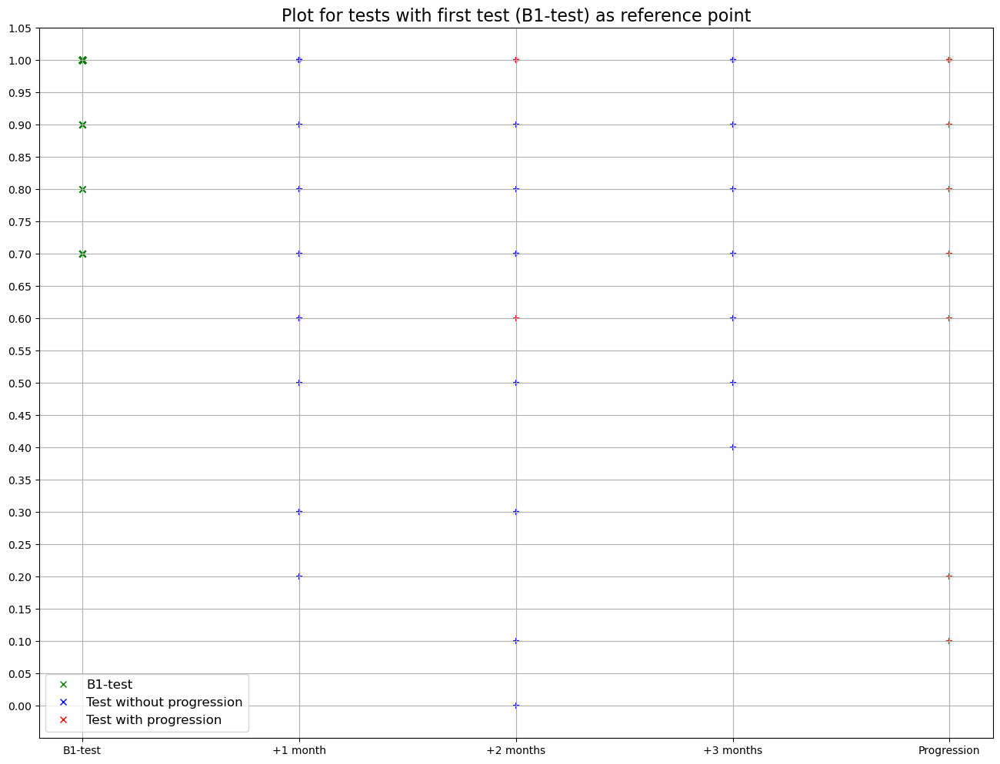

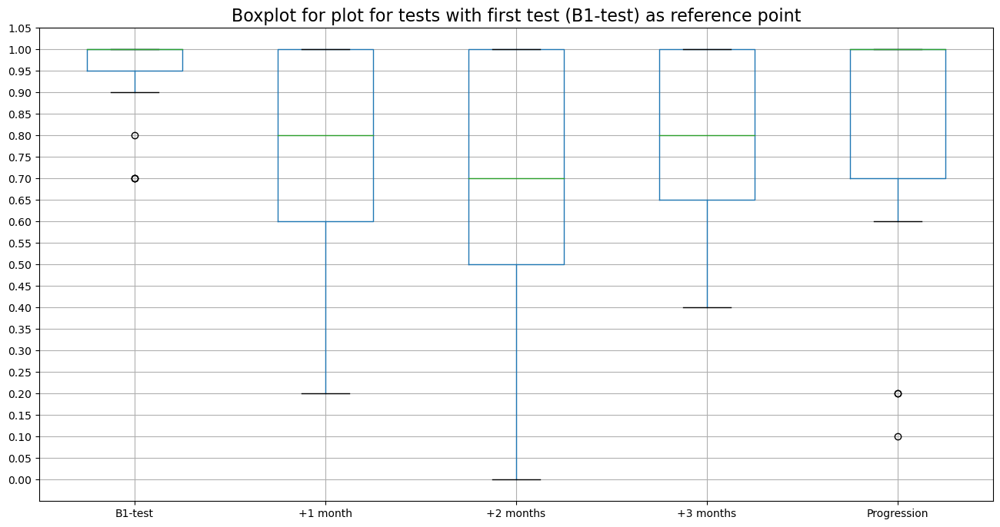

In [78]:
#Note: months_2 is the database for the created plots
months_2 = plot_B1_test_ref(df_all)

In [79]:
months_2

,Person,B1-test,+1 m,+2 m,+3 m,Progression,Progression place
0,P01,1.0,1.0,0.7,0.8,1.0,Progression
1,P02,0.8,0.7,0.1,1.0,1.0,Progression
2,P03,1.0,0.6,NaN,NaN,NaN,+1 m
3,P09,0.9,1.0,0.7,0.6,1.0,Progression
4,P10,1.0,0.3,0.5,0.4,0.6,Progression
5,P11,1.0,0.9,0.3,0.5,0.8,Progression
6,P13,1.0,1.0,1.0,NaN,NaN,+2 m
7,P15,0.7,0.5,0.7,0.6,1.0,Progression
8,P16,1.0,0.8,1.0,1.0,0.9,Progression
9,P17,1.0,0.3,0.3,0.7,1.0,Progression


## Wilcoxon Signed-Rank Test for B1 test as reference point

In [80]:
wilcoxon_B1_test(months_2)

C:\Users\Ayoop\anaconda3\lib\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
C:\Users\Ayoop\anaconda3\lib\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


,+1 month,+2 months,+3 months,Progression
B1-test,0.001471,0.001444,0.028189,0.020706
+1 month,,0.124163,0.196794,0.194506
+2 months,,,0.022282,0.056633
+3 months,,,,0.693766
